In [674]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
######
from sklearn.model_selection import train_test_split
######
from sklearn.base import BaseEstimator, TransformerMixin
######
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
######
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
######
from sklearn.pipeline import FeatureUnion
######
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
######
from sklearn.linear_model import SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import LinearSVR
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor, RandomForestRegressor
models = [SGDRegressor(), DecisionTreeRegressor(), LinearSVR(), AdaBoostRegressor(), 
          GradientBoostingRegressor(), RandomForestRegressor(), MLPRegressor()]
######
from sklearn.model_selection import cross_val_predict, cross_val_score, GridSearchCV, RandomizedSearchCV


# Gathering the data

In [6]:
newdf = pd.read_excel('/Users/swapnilsrivastava/Desktop/Disseration data/datasets/Projectdata_Raw.xlsx')


In [7]:
newdf.head(25)

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Messi,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png
5,200389,https://sofifa.com/player/200389/jan-oblak/220002,J. Oblak,Jan Oblak,GK,91,93,112000000.0,130000.0,28,...,33+3,33+3,33+3,32+3,89+3,https://cdn.sofifa.net/players/200/389/22_120.png,https://cdn.sofifa.net/teams/240/60.png,https://cdn.sofifa.net/flags/es.png,NaN,https://cdn.sofifa.net/flags/si.png
6,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé Lottin,"ST, LW",91,95,194000000.0,230000.0,22,...,54+3,54+3,54+3,63+3,18+3,https://cdn.sofifa.net/players/231/747/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1335/60.png,https://cdn.sofifa.net/flags/fr.png
7,167495,https://sofifa.com/player/167495/manuel-neuer/...,M. Neuer,Manuel Peter Neuer,GK,90,90,13500000.0,86000.0,35,...,34+3,34+3,34+3,35+3,88+2,https://cdn.sofifa.net/players/167/495/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1337/60.png,https://cdn.sofifa.net/flags/de.png
8,192448,https://sofifa.com/player/192448/marc-andre-te...,M. ter Stegen,Marc-André ter Stegen,GK,90,92,99000000.0,250000.0,29,...,33+3,33+3,33+3,31+3,88+3,https://cdn.sofifa.net/players/192/448/22_120.png,https://cdn.sofifa.net/teams/241/60.png,https://cdn.sofifa.net/flags/es.png,NaN,https://cdn.sofifa.net/flags/de.png
9,202126,https://sofifa.com/player/202126/harry-kane/22...,H. Kane,Harry Kane,ST,90,90,129500000.0,240000.0,27,...,61+3,61+3,61+3,64+3,20+3,https://cdn.sofifa.net/players/202/126/22_120.png,https://cdn.sofifa.net/teams/18/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1318/60.png,https://cdn.sofifa.net/flags/gb-eng.png


In [9]:

newdf = newdf.query('league_name == "English Premier League" | league_name == "German 1. Bundesliga" | league_name== "French Ligue 1"')


In [10]:
newdf.head(10)

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Messi,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png
6,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé Lottin,"ST, LW",91,95,194000000.0,230000.0,22,...,54+3,54+3,54+3,63+3,18+3,https://cdn.sofifa.net/players/231/747/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1335/60.png,https://cdn.sofifa.net/flags/fr.png
7,167495,https://sofifa.com/player/167495/manuel-neuer/...,M. Neuer,Manuel Peter Neuer,GK,90,90,13500000.0,86000.0,35,...,34+3,34+3,34+3,35+3,88+2,https://cdn.sofifa.net/players/167/495/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1337/60.png,https://cdn.sofifa.net/flags/de.png
9,202126,https://sofifa.com/player/202126/harry-kane/22...,H. Kane,Harry Kane,ST,90,90,129500000.0,240000.0,27,...,61+3,61+3,61+3,64+3,20+3,https://cdn.sofifa.net/players/202/126/22_120.png,https://cdn.sofifa.net/teams/18/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1318/60.png,https://cdn.sofifa.net/flags/gb-eng.png
10,215914,https://sofifa.com/player/215914/ngolo-kante/2...,N. Kanté,N'Golo Kanté,"CDM, CM",90,90,100000000.0,230000.0,30,...,84+3,84+3,84+3,85+3,20+3,https://cdn.sofifa.net/players/215/914/22_120.png,https://cdn.sofifa.net/teams/5/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1335/60.png,https://cdn.sofifa.net/flags/fr.png
13,200104,https://sofifa.com/player/200104/heung-min-son...,H. Son,Son Heung-min,"LM, CF, LW",89,89,104000000.0,220000.0,28,...,54+3,54+3,54+3,64+3,19+3,https://cdn.sofifa.net/players/200/104/22_120.png,https://cdn.sofifa.net/teams/18/60.png,https://cdn.sofifa.net/flags/gb-eng.png,NaN,https://cdn.sofifa.net/flags/kr.png


In [11]:
#downloading the df in csv format
newdf.to_excel(r'/Users/swapnilsrivastava/Desktop/newdfexportAug.xlsx', index = False)

In [13]:
#calling the libraries
from selenium import webdriver  
from selenium.common.exceptions import NoSuchElementException  
from selenium.webdriver.common.keys import Keys  
from bs4 import BeautifulSoup
import time

In [15]:
#scraping the data: data was scraped wrongly as the scraping was happenning on the original dataset which has more than 19000 data
resultcount=[]
def impute_Wikipedea(cols):
    url = cols[0]
    browser = webdriver.Chrome(executable_path=r"/Users/swapnilsrivastava/Downloads/chromedriver")
    browser.get(url)  
    time.sleep(5)
    html_source = browser.page_source  
    browser.quit()

    
    soup = BeautifulSoup(html_source,'html.parser') 
    try:
        comments = soup.find_all('span',{'class':'pull-right'})  
        result = (comments[5].text.split('\n')[1].replace(' ',''))
    except IndexError:
        result = '0'
    resultcount.append(result)
    print(result+" "+str(len(resultcount)))
    return resultcount

In [17]:
newdf[['URL']].apply(impute_Wikipedea,axis=1)

/var/folders/_y/xn3ctgpx2kq_z25wf8cn757r0000gn/T/ipykernel_1149/1726364060.py:4: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  browser = webdriver.Chrome(executable_path=r"/Users/swapnilsrivastava/Downloads/chromedriver")


16 11
264,938 12
46 13
35 14
135,087 15
4 16
3 17
326,786 18
105,863 19
156,872 20
115,004 21
201,982 22
4 23
19 24
3 25
0 26
56,438 27
7 28
0 29
0 30
119,728.5 31
79 32
532 33
39,929 34
0 35
86,652 36
161,832 37
51,245 38
30 39
1 40
55,179 41
90,084 42
95,801.5 43
2 44
25,340 45
0 46
3,805 47
52,357.5 48
76,501 49
107,829 50
9 51
4 52
44,865 53
1 54
3.5 55
31 56
2 57
99 58
11,358.5 59
4 60
10,281 61
48,503 62
49,862 63
66,387 64
2 65
6 66
0 67
2 68
2 69
156,434 70
2 71
50,496 72
94,252 73
0 74
25,859 75
19,305 76
0 77
163,520 78
24,368 79
33,438 80
115,349 81
8,365 82
14,243 83
56,036 84
2 85
58 86
65,388 87
30,575 88
2 89
1 90
9 91
4 92
37 93
21,502 94
47,814 95
2 96
5,921 97
20,820 98
0 99
46 100
7,906 101
0 102
45,156 103
269 104
2 105
32,818 106
97,683 107
40,375 108
33,316 109
5 110
8,611 111
0 112
0 113
36,203 114
28,264 115
37,439 116
8 117
118,205 118
95,591 119
20,830 120
0 121
20,773 122
34,027 123
53,272 124
135 125
2,718 126
57,268 127
5,271 128
23,230 129
2 130
22,684 131

1 970
1,227 971
2 972
4 973
1 974
559 975
0 976
713 977
1,664 978
395 979
311 980
7,698 981
32 982
935 983
3 984
7,543 985
1,141 986
332 987
366 988
1,351 989
823 990
0 991
255 992
8,789 993
522 994
645 995
55 996
283 997
0 998
1,186 999
0 1000
28 1001
696 1002
845 1003
857 1004
6,590 1005
592 1006
1 1007
269 1008
10,711 1009
246 1010
666 1011
3,565 1012
0 1013
0 1014
716 1015
1 1016
1 1017
2 1018
223.5 1019
4.5 1020
311 1021
20,969 1022
0 1023
291 1024
13,140 1025
499 1026
1 1027
1,287 1028
931 1029
895.5 1030
2,131 1031
1,345 1032
3 1033
31,773 1034
0 1035
3.5 1036
8 1037
0 1038
250 1039
1 1040
8,290 1041
15,066 1042
1,834 1043
10,629 1044
456 1045
1,079 1046
11,547 1047
602 1048
142 1049
7,235 1050
8,066 1051
860 1052
11,980 1053
54 1054
1,809 1055
858 1056
819 1057
214 1058
244 1059
0 1060
22,785 1061
6,609 1062
153 1063
853 1064
2,473 1065
7,524 1066
2,747 1067
429 1068
1,324 1069
1 1070
200 1071
57 1072
37 1073
993 1074
0 1075
1,441 1076
25,699 1077
146 1078
648 1079
1,729 1080
8

WebDriverException: Message: unknown error: net::ERR_INTERNET_DISCONNECTED
  (Session info: chrome=103.0.5060.134)
Stacktrace:
0   chromedriver                        0x0000000105798ef9 chromedriver + 4480761
1   chromedriver                        0x00000001057245d3 chromedriver + 4003283
2   chromedriver                        0x00000001053b7338 chromedriver + 410424
3   chromedriver                        0x00000001053b0fb5 chromedriver + 384949
4   chromedriver                        0x00000001053a3a7d chromedriver + 330365
5   chromedriver                        0x00000001053a48ba chromedriver + 334010
6   chromedriver                        0x00000001053a3ce7 chromedriver + 330983
7   chromedriver                        0x00000001053a31f7 chromedriver + 328183
8   chromedriver                        0x00000001053a20c6 chromedriver + 323782
9   chromedriver                        0x00000001053a24a2 chromedriver + 324770
10  chromedriver                        0x00000001053b8dc2 chromedriver + 417218
11  chromedriver                        0x000000010541dc8f chromedriver + 830607
12  chromedriver                        0x000000010540aa62 chromedriver + 752226
13  chromedriver                        0x000000010541d4f1 chromedriver + 828657
14  chromedriver                        0x000000010540a953 chromedriver + 751955
15  chromedriver                        0x00000001053e0cd5 chromedriver + 580821
16  chromedriver                        0x00000001053e1d25 chromedriver + 584997
17  chromedriver                        0x000000010576a02d chromedriver + 4288557
18  chromedriver                        0x000000010576f1b3 chromedriver + 4309427
19  chromedriver                        0x000000010577423f chromedriver + 4330047
20  chromedriver                        0x000000010576fdfa chromedriver + 4312570
21  chromedriver                        0x0000000105748fef chromedriver + 4153327
22  chromedriver                        0x0000000105789d78 chromedriver + 4418936
23  chromedriver                        0x0000000105789eff chromedriver + 4419327
24  chromedriver                        0x00000001057a0ab5 chromedriver + 4512437
25  libsystem_pthread.dylib             0x00007fff67695109 _pthread_start + 148
26  libsystem_pthread.dylib             0x00007fff67690b8b thread_start + 15


In [22]:
len(resultcount)

1271

In [25]:
newdf.loc[1230].values

array([203741, 'https://sofifa.com/player/203741/thomas-delaine/220002',
       'T. Delaine', 'Thomas Delaine', 'LWB, LB, RB', 76, 76, 6500000.0,
       19000.0, 29, Timestamp('1992-03-24 00:00:00'), 180, 70, 68.0,
       'FC Metz', 'French Ligue 1', 1.0, 'LWB', 17.0, nan,
       Timestamp('2018-08-30 00:00:00'), 2022.0, 18, 'France', nan, nan,
       nan, 'Left', 5, 3, 1, 'High/Medium', 'Normal (170-185)', 'No',
       13000000.0, nan,
       'Dives Into Tackles (AI), Early Crosser, Speed Dribbler (AI)',
       85.0, 51.0, 72.0, 74.0, 67.0, 75.0, 76, 45, 64, 72, 35, 74, 68, 45,
       70, 76, 83, 86, 79, 73, 66, 62, 65, 84, 71, 51, 75, 68, 74, 75, 45,
       67, 67, 68, 68, 15, 11, 14, 10, 10, nan, '66+2', '66+2', '66+2',
       72, 70, 70, 70, 72, '72+2', '72+2', '72+2', '74+2', '72+2', '72+2',
       '72+2', '74+2', '74+2', '72+2', '72+2', '72+2', '74+2', '73+2',
       '69+2', '69+2', '69+2', '73+2', '18+2',
       'https://cdn.sofifa.net/players/203/741/22_120.png',
       'https:

In [ ]:
#Continue on scraping file

###### reading the final dataset after scraping again the player's wikipedia view count for the 666 players whose counts were not scraped correctly and then merging it with the original dataset

In [368]:
finaldf = pd.read_excel('/Users/swapnilsrivastava/Desktop/Disseration data/datasets/FinalDataset.xlsx')

# EDA Data Exploration: Discover and visualize the data to gain insights

In [15]:
#EDA-------------
import matplotlib.pyplot as plt
from collections import Counter
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
from matplotlib import rcParams

In [16]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

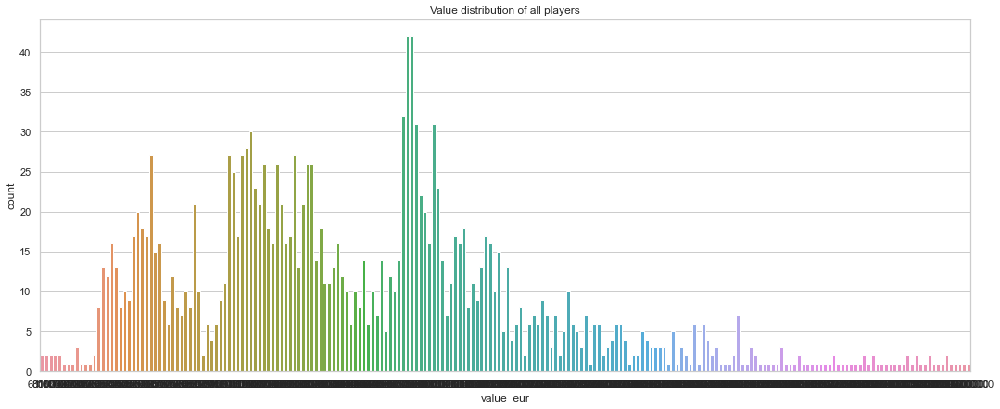

In [87]:
# Value ditribution
plt.figure(1, figsize=(18, 7))
sns.set(style="whitegrid")
sns.countplot( x= 'value_eur', data=finaldf)
plt.title('Value distribution of all players')
plt.show()


In [319]:
finaldf.columns

Index(['sofifa_id', 'overall', 'potential', 'value_eur', 'wage_eur', 'age',
       'height_cm', 'weight_kg', 'club_team_id', 'league_name',
       'club_position', 'club_contract_valid_until', 'nationality_id',
       'preferred_foot', 'weak_foot', 'skill_moves',
       'international_reputation', 'lw', 'lf', 'cf', 'rf', 'rw', 'gk',
       'Wikipedia_Views', 'work_rate1', 'work_rate2', 'ls1', 'ls2', 'st1',
       'st2', 'rs1', 'rs2', 'lam1', 'lam2', 'cam1', 'cam2', 'ram1', 'ram2',
       'lm1', 'lm2', 'lcm1', 'lcm2', 'cm1', 'cm2', 'rcm1', 'rcm2', 'rm1',
       'rm2', 'lwb1', 'lwb2', 'ldm1', 'ldm2', 'cdm1', 'cdm2', 'rdm1', 'rdm2',
       'rwb1', 'rwb2', 'lb1', 'lb2', 'lcb1', 'lcb2', 'cb1', 'cb2', 'rcb1',
       'rcb2', 'rb1', 'rb2', 'gk1', 'gk2', 'pace', 'pass', 'shooting',
       'defending', 'dribbling', 'physical', 'goalkeeping', 'body_type1'],
      dtype='object')

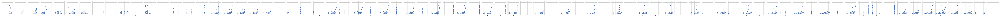

In [323]:
sns.pairplot(finaldf, x_vars=['sofifa_id', 'overall', 'potential', 'wage_eur', 'age',
       'height_cm', 'weight_kg', 'club_team_id', 'league_name',
       'club_position', 'club_contract_valid_until', 'nationality_id',
       'preferred_foot', 'weak_foot', 'skill_moves',
       'international_reputation', 'lw', 'lf', 'cf', 'rf', 'rw', 'gk',
       'Wikipedia_Views', 'work_rate1', 'work_rate2', 'ls1', 'ls2', 'st1',
       'st2', 'rs1', 'rs2', 'lam1', 'lam2', 'cam1', 'cam2', 'ram1', 'ram2',
       'lm1', 'lm2', 'lcm1', 'lcm2', 'cm1', 'cm2', 'rcm1', 'rcm2', 'rm1',
       'rm2', 'lwb1', 'lwb2', 'ldm1', 'ldm2', 'cdm1', 'cdm2', 'rdm1', 'rdm2',
       'rwb1', 'rwb2', 'lb1', 'lb2', 'lcb1', 'lcb2', 'cb1', 'cb2', 'rcb1',
       'rcb2', 'rb1', 'rb2', 'gk1', 'gk2', 'pace', 'pass', 'shooting',
       'defending', 'dribbling', 'physical', 'goalkeeping', 'body_type1'], y_vars='value_eur', size=7, aspect=0.8)

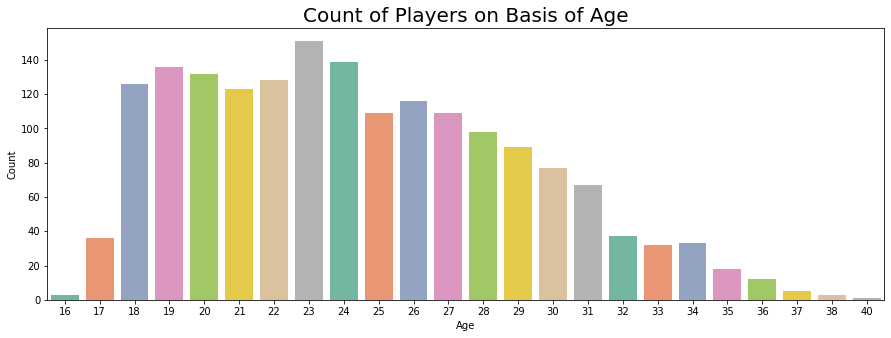

In [17]:
#1. Count of players on the basis of age
plt.figure(figsize= (15,5))

ax = sns.countplot(x='age', data=finaldf, palette='Set2')
ax.set_title(label='Count of Players on Basis of Age', fontsize=20)

ax.set_xlabel(xlabel='Age', fontsize=10)
ax.set_ylabel(ylabel='Count', fontsize=10)

plt.show()

In [18]:
dfage = finaldf["age"].mean()
print(dfage)

24.44887640449438


In [ ]:
###### The age of maximum players lie between 18 to 27 years with a mean of around 24 years
#The minimum age of the players in the game is 16 years whereas the maximum age is 40 year

In [19]:
finaldf['nationality_name'].value_counts()

France                    360
Germany                   275
England                   274
Brazil                     54
Spain                      53
Netherlands                53
Portugal                   40
Belgium                    34
Senegal                    31
Austria                    30
Denmark                    28
Switzerland                28
Republic of Ireland        26
Scotland                   24
Côte d'Ivoire              22
Mali                       20
Poland                     19
Nigeria                    18
Argentina                  18
Ghana                      18
Norway                     17
Algeria                    16
United States              16
Morocco                    15
Wales                      13
Croatia                    13
Turkey                     12
Cameroon                   12
Japan                      12
Greece                     11
Czech Republic             11
Italy                      10
Sweden                     10
Serbia    

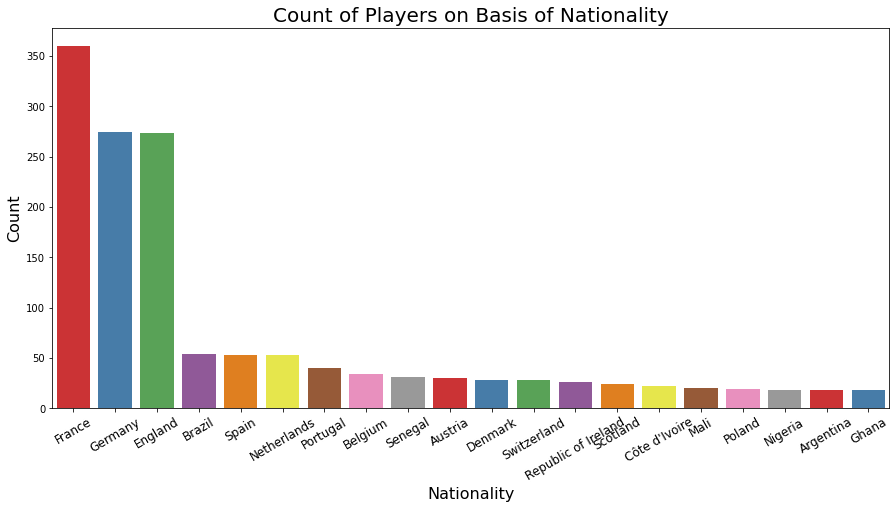

In [20]:
#2. Count of players on the basis of nationality
plt.figure(figsize= (15, 7))

ax = sns.countplot(x='nationality_name', data=newdf, palette='Set1', order=finaldf.nationality_name.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on Basis of Nationality', fontsize=20)

ax.set_xlabel(xlabel='Nationality', fontsize=16)
ax.set_ylabel(ylabel='Count', fontsize=16)
plt.xticks(rotation=30, fontsize=12)

plt.show()

###### 3.  GeoScatter to visualize the mean overall, average player's value and total number of players from each country.
GeoJSON is a special type of file which is made to represent simple geographical features, along with their non-spatial attributes. Here the features' polygonal coordinates relate with their actual coordinates on the globe, making it easier to plot entities likes districts and states if their coordinates are not provided already in the module.
I made a chloropleth and GeoScatter to visualize the mean overall, average player's value and total number of players from each country.



In [21]:
import json
from IPython.core.display import display, HTML
import tempfile

In [22]:
import plotly.graph_objects as go
import plotly.express as px

In [35]:
country_count = finaldf.nationality_name.value_counts()
counts = country_count.sort_index().reset_index().nationality_name

In [36]:
world_geojson = json.load(open("/Users/swapnilsrivastava/Desktop/Disseration data/countries.geo.json", "r"))
countries = pd.DataFrame(finaldf.groupby(['nationality_name']).overall.mean())
countries["value_eur"] = finaldf.groupby(['nationality_name']).value_eur.mean()
countries.reset_index(inplace = True)
countries["count"] = counts

In [25]:
countries.head(100)

,nationality_name,overall,value_eur,count
0,Albania,70.000000,3.800000e+06,1
1,Algeria,74.375000,1.168125e+07,16
2,Angola,66.500000,1.775000e+06,2
3,Argentina,78.388889,2.377639e+07,18
4,Armenia,63.000000,2.175000e+06,2
5,Australia,63.666667,1.200000e+06,3
6,Austria,74.000000,9.501000e+06,30
7,Belgium,74.794118,1.771103e+07,34
8,Benin,73.000000,3.666667e+06,3
9,Bosnia and Herzegovina,73.800000,4.020000e+06,5


In [26]:
print(countries.dtypes)

nationality_name     object
overall             float64
value_eur           float64
count                 int64
dtype: object


In [47]:
fig = px.scatter_geo(
    countries,
    geojson=world_geojson,
    featureidkey='properties.name', 
    locations='nationality_name',
    size = 'count',
    color='value_eur',
    color_continuous_scale='Reds'
)


fig.update_layout(
    title_text = 'Number of players per country',
    geo = dict(
        showland = True,
        landcolor = 'rgb(122, 122, 122)',
        countrycolor = 'rgb(204, 204, 00)',
    ),
)

fig.show()

In the above graph:- 
-The size of circle denotes the count of player from that country
-The colour denotes the average of the player's value of the players belonging to that particular country

While going through the graph, I saw that the English player's data was not visible on the map. I found that because names in the csv and the JSON were not matching, so I created a new similar finaldfCopy by copying the finaldf changed the name values in DataFrame to be consistent with the ones in the JSON file and then again plotted it on the map.
** I changed the nationality of all the players' with 'England', 'Wales', 'Northern Ireland', 'Scotland' to 'United Kingdom'

In [69]:
#extra
finaldfCopy = finaldf.copy()


In [30]:
finaldfCopy.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,club_team_id,club_name,league_name,league_level,club_position,club_jersey_number,club_loaned_from,club_joined,club_contract_valid_until,nationality_id,nationality_name,nation_team_id,nation_position,nation_jersey_number,preferred_foot,weak_foot,skill_moves,international_reputation,work_rate,body_type,real_face,release_clause_eur,player_tags,player_traits,pace,shooting,passing,dribbling,defending,physic,Pass_crossing,shooting_finishing,defending_heading_accuracy,passing_short_passing,shooting_volleys,dribbling_dribbling,passing_curve,passing_fk_accuracy,passing_long_passing,dribbling_ball_control,pace_acceleration,pace_sprint_speed,dribbling_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url,URL,Wikipedia_Views
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000,320000,34,1987-06-24,170,72,73,Paris Saint-Germain,French Ligue 1,1,RW,30,NaN,2021-08-10,2023,52,Argentina,1369.0,RW,10.0,Left,4,4,5,Medium/Low,Unique,Yes,144300000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...","Finesse Shot, Long Shot Taker (AI), Playmaker ...",85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93+1,93+1,93+-1,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png,https://pageviews.wmcloud.org/?project=en.wiki...,"1,072,960"
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000,270000,32,1988-08-21,185,81,21,FC Bayern München,German 1. Bundesliga,1,ST,9,NaN,2014-07-01,2023,37,Poland,1353.0,RS,9.0,Right,4,4,5,High/Medium,Unique,Yes,197200000.0,"#Aerial Threat, #Distance Shooter, #Clinical F...","Solid Player, Finesse Shot, Outside Foot Shot,...",78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png,https://pageviews.wmcloud.org/?project=en.wiki...,"264,938"
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000,270000,36,1985-02-05,187,83,11,Manchester United,English Premier League,1,ST,7,NaN,2021-08-27,2023,38,Portugal,1354.0,ST,7.0,Right,4,5,5,High/Low,Unique,Yes,83300000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...","Power Free-Kick, Flair, Long Shot Taker (AI), ...",87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https:

In [70]:
finaldfCopy['nationality_name'] = finaldf['nationality_name'].replace(['England', 'Wales', 'Northern Ireland', 'Scotland'], 'United Kingdom')

In [71]:
country_count = finaldfCopy.nationality_name.value_counts()
counts = country_count.sort_index().reset_index().nationality_name

In [72]:
world_geojson = json.load(open("/Users/swapnilsrivastava/Desktop/Disseration data/countries.geo.json", "r"))
countries = pd.DataFrame(finaldfCopy.groupby(['nationality_name']).overall.mean())
countries["value_eur"] = finaldfCopy.groupby(['nationality_name']).value_eur.mean()
countries.reset_index(inplace = True)
countries["count"] = counts

In [73]:
countries.head(100)

,nationality_name,overall,value_eur,count
0,Albania,70.000000,3.800000e+06,1
1,Algeria,74.375000,1.168125e+07,16
2,Angola,66.500000,1.775000e+06,2
3,Argentina,78.388889,2.377639e+07,18
4,Armenia,63.000000,2.175000e+06,2
5,Australia,63.666667,1.200000e+06,3
6,Austria,74.000000,9.501000e+06,30
7,Belgium,74.794118,1.771103e+07,34
8,Benin,73.000000,3.666667e+06,3
9,Bosnia and Herzegovina,73.800000,4.020000e+06,5


In [43]:
print(countries.dtypes)

nationality_name     object
overall             float64
value_eur           float64
count                 int64
dtype: object


In [74]:
fig = px.scatter_geo(
    countries,
    geojson=world_geojson,
    featureidkey='properties.name', 
    locations='nationality_name',
    size = 'count',
    color='value_eur',
    color_continuous_scale='Reds'
)


fig.update_layout(
    title_text = 'Number of players per country',
    geo = dict(
        showland = True,
        landcolor = 'rgb(122, 122, 122)',
        countrycolor = 'rgb(204, 204, 00)',
    ),
)

fig.show()

In [75]:
fig = px.choropleth(
    countries,
    geojson=world_geojson,
    featureidkey='properties.name', 
    locations='nationality_name',
    color='overall',
    color_continuous_scale='Reds'
)

fig.update_layout(
    title_text = 'Average overall rating per nationality',
    geo = dict(
        showland = True,
        countrycolor = 'rgb(204, 204, 00)',
        
    ),
)

fig.show()

The above graph denotes
-The brightness of the colour denotes the mean of the overall rating of all the players belonging to that nationality

In [221]:
#Removing comma from Wikipedia_Views column so as to convert it into integer 

finaldfCopy['Wikipedia_Views']=finaldf['Wikipedia_Views'].str.replace(',','')

In [623]:
corr_matrix = finaldf.corr()
corr_matrix

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,club_contract_valid_until,nationality_id,weak_foot,skill_moves,international_reputation,lw,lf,cf,rf,rw,Wikipedia_Views,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending,dribbling,physical,goalkeeping
sofifa_id,1.000000,-0.572268,0.046701,-0.183025,-0.410189,-0.907600,-0.103167,-0.272148,0.027139,0.189929,0.026596,-0.091162,-0.066227,-0.501433,-0.081588,-0.108175,-0.108175,-0.108175,-0.081588,-0.256636,-0.281127,-0.114645,-0.281127,-0.114645,-0.281127,-0.114645,-0.284016,-0.072824,-0.284016,-0.072824,-0.284016,-0.062170,-0.278605,-0.097376,-0.321340,-0.114489,-0.321340,-0.114489,-0.321340,-0.114489,-0.278605,-0.097376,-0.285108,-0.130498,-0.300037,-0.107862,-0.300037,-0.107862,-0.300037,-0.107862,-0.285108,-0.130498,-0.270018,-0.192160,-0.249603,-0.134834,-0.249603,-0.134834,-0.249603,-0.134834,-0.270018,-0.192160,-0.034063,-0.130132,0.148494,-0.177258,-0.140656,-0.099113,-0.147631,-0.274123,-0.214913
overall,-0.572268,1.000000,0.631128,0.663712,0.747840,0.582069,0.028857,0.184165,-0.002452,0.190769,0.047850,0.227493,0.373467,0.666935,0.456978,0.484084,0.484084,0.484084,0.456978,0.297288,0.482138,0.337338,0.482138,0.337338,0.482138,0.337338,0.490451,0.254979,0.490451,0.254979,0.490451,0.239299,0.482129,0.259643,0.549201,0.304332,0.549201,0.304332,0.549201,0.304332,0.482129,0.259643,0.465171,0.372410,0.486272,0.301464,0.486272,0.301464,0.486272,0.301464,0.465171,0.372410,0.440032,0.444768,0.393156,0.327204,0.393156,0.327204,0.393156,0.327204,0.440032,0.444768,0.066140,0.333076,0.253975,0.496440,0.407297,0.312388,0.535538,0.553467,0.010076
potential,0.046701,0.631128,1.000000,0.666550,0.590360,-0.141638,-0.035692,-0.027135,0.023206,0.401207,-0.025751,0.221879,0.340496,0.463352,0.395701,0.404163,0.404163,0.404163,0.395701,0.301716,0.286171,0.341002,0.286171,0.341002,0.286171,0.341002,0.291148,0.282786,0.291148,0.282786,0.291148,0.266019,0.284165,0.281277,0.321136,0.322014,0.321136,0.322014,0.321136,0.322014,0.284165,0.281277,0.240122,0.401281,0.252778,0.341891,0.252778,0.341891,0.252778,0.341891,0.240122,0.401281,0.221597,0.434747,0.190191,0.341817,0.190191,0.341817,0.190191,0.341817,0.221597,0.434747,0.080787,0.340456,0.362544,0.368857,0.301766,0.200884,0.444225,0.306357,-0.100096
value_eur,-0.183025,0.663712,0.666550,1.000000,0.851865,0.138743,-0.022447,0.045679,-0.003781,0.240121,-0.007643,0.196629,0.329348,0.677496,0.370262,0.385655,0.385655,0.385655,0.370262,0.410509,0.297854,0.507410,0.297854,0.507410,0.297854,0.507410,0.302456,0.408570,0.302456,0.408570,0.302456,0.385533,0.293964,0.418871,0.331520,0.481827,0.331520,0.481827,0.331520,0.481827,0.293964,0.418871,0.242454,0.580057,0.253263,0.517677,0.253263,0.517677,0.253263,0.517677,0.242454,0.580057,0.222308,0.643001,0.188390,0.505031,0.188390,0.505031,0.188390,0.505031,0.222308,0.643001,0.093287,0.516848,0.261426,0.385156,0.337766,0.160525,0.410917,0.309134,-0.043491
wage_eur,-0.410189,0.747840,0.590360,0.851865,1.000000,0.369555,-0.025962,0.075468,-0.022896,0.157145,0.015653,0.211776,0.361371,0.734262,0.404768,0.425802,0.425802,0.425802,0.404768,0.524433,0.352914,0.446295,0.352914,0.446295,0.352914,0.446295,0.354014,0.354160,0.354014,0.354160,0.354014,0.320585,0.345988,0.379659,0.388478,0.430093,0.388478,0.430093,0.388478,0.430093,0.345988,0.379659,0.296450,0.538149,0.312651,0.474861,0.312651,0.474861,0.312651,0.474861,0.296450,0.538149,0.273689,0.607961,0.231581,0.478871,0.231581,0.478871,0.231581,0.478871,0.273689,0.607961,0.077161,0.483541,0.230899,0.444595,0.387154,0.209950,0.452600,0.378849,-0.043843
age,-0.907600,0.582069,-0.141638,0.138743,0.369555,1.000000,0.125491,0.304363,-0.026213,-0.220988,0.044394,0.067580,0.028985,0.468946,0.067517,0.094168,0.094168,0.094168,0.067517,0.138194,0.287522,0.107096,0.28752

In [681]:
sns.set(font_scale=0.8)

In [682]:
fig = plt.figure(figsize=[400,200])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=4,linecolor='grey',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f', annot_kws={"size":80})
plt.title('Correlation Heatmap', weight='bold',fontsize=100)
plt.savefig('heatmap1.png',transparent=True, bbox_inches='tight')


In [675]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = finaldf.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [679]:
corr_features = correlation(finaldf, 0.8)
len(set(corr_features))

44

In [678]:
corr_features

{'age',
 'cam1',
 'cam2',
 'cb1',
 'cb2',
 'cdm1',
 'cdm2',
 'cf',
 'cm1',
 'cm2',
 'dribbling',
 'lam1',
 'lb1',
 'lb2',
 'lcb1',
 'lcm1',
 'ldm1',
 'lf',
 'lm1',
 'lw',
 'lwb1',
 'pass',
 'ram1',
 'ram2',
 'rb1',
 'rb2',
 'rcb1',
 'rcb2',
 'rcm1',
 'rcm2',
 'rdm1',
 'rdm2',
 'rf',
 'rm1',
 'rm2',
 'rs1',
 'rs2',
 'rw',
 'rwb1',
 'rwb2',
 'shooting',
 'st1',
 'st2',
 'wage_eur'}

### Data Pre-processing to make it into machine-readable form

In [370]:
#Removing comma from Wikipedia_Views column so as to convert it into integer 

finaldf['Wikipedia_Views']=finaldf['Wikipedia_Views'].str.replace(',','')


In [371]:
finaldf.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,club_team_id,club_name,league_name,league_level,club_position,club_jersey_number,club_loaned_from,club_joined,club_contract_valid_until,nationality_id,nationality_name,nation_team_id,nation_position,nation_jersey_number,preferred_foot,weak_foot,skill_moves,international_reputation,work_rate,body_type,real_face,release_clause_eur,player_tags,player_traits,pace,shooting,passing,dribbling,defending,physic,Pass_crossing,shooting_finishing,defending_heading_accuracy,passing_short_passing,shooting_volleys,dribbling_dribbling,passing_curve,passing_fk_accuracy,passing_long_passing,dribbling_ball_control,pace_acceleration,pace_sprint_speed,dribbling_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url,URL,Wikipedia_Views
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000,320000,34,1987-06-24,170,72,73,Paris Saint-Germain,French Ligue 1,1,RW,30,NaN,2021-08-10,2023,52,Argentina,1369.0,RW,10.0,Left,4,4,5,Medium/Low,Unique,Yes,144300000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...","Finesse Shot, Long Shot Taker (AI), Playmaker ...",85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93+1,93+1,93+-1,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png,https://pageviews.wmcloud.org/?project=en.wiki...,1072960
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000,270000,32,1988-08-21,185,81,21,FC Bayern München,German 1. Bundesliga,1,ST,9,NaN,2014-07-01,2023,37,Poland,1353.0,RS,9.0,Right,4,4,5,High/Medium,Unique,Yes,197200000.0,"#Aerial Threat, #Distance Shooter, #Clinical F...","Solid Player, Finesse Shot, Outside Foot Shot,...",78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png,https://pageviews.wmcloud.org/?project=en.wiki...,264938
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000,270000,36,1985-02-05,187,83,11,Manchester United,English Premier League,1,ST,7,NaN,2021-08-27,2023,38,Portugal,1354.0,ST,7.0,Right,4,5,5,High/Low,Unique,Yes,83300000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...","Power Free-Kick, Flair, Long Shot Taker (AI), ...",87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.s

In [182]:
finaldf.to_excel(r'/Users/swapnilsrivastava/Desktop/newdfexportAug.xlsx', index = False)

In [372]:
#Removing the attributes that are not relevant for modelling: Removing 15 columns

finaldf.drop(['player_url' ,'short_name' ,'player_positions' ,'player_face_url' ,'club_logo_url' ,'club_flag_url' ,'nation_logo_url' ,'nation_flag_url' ,'URL' ,'club_name' ,'club_jersey_number','nation_jersey_number', 'real_face' ,'player_tags','player_traits'], axis=1, inplace=True)


In [373]:
finaldf.head()

,sofifa_id,long_name,overall,potential,value_eur,wage_eur,age,dob,height_cm,weight_kg,club_team_id,league_name,league_level,club_position,club_loaned_from,club_joined,club_contract_valid_until,nationality_id,nationality_name,nation_team_id,nation_position,preferred_foot,weak_foot,skill_moves,international_reputation,work_rate,body_type,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,Pass_crossing,shooting_finishing,defending_heading_accuracy,passing_short_passing,shooting_volleys,dribbling_dribbling,passing_curve,passing_fk_accuracy,passing_long_passing,dribbling_ball_control,pace_acceleration,pace_sprint_speed,dribbling_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,Wikipedia_Views
0,158023,Lionel Andrés Messi Cuccittini,93,93,78000000,320000,34,1987-06-24,170,72,73,French Ligue 1,1,RW,NaN,2021-08-10,2023,52,Argentina,1369.0,RW,Left,4,4,5,Medium/Low,Unique,144300000.0,85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93+1,93+1,93+-1,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,1072960
1,188545,Robert Lewandowski,92,92,119500000,270000,32,1988-08-21,185,81,21,German 1. Bundesliga,1,ST,NaN,2014-07-01,2023,37,Poland,1353.0,RS,Right,4,4,5,High/Medium,Unique,197200000.0,78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,264938
2,20801,Cristiano Ronaldo dos Santos Aveiro,91,91,45000000,270000,36,1985-02-05,187,83,11,English Premier League,1,ST,NaN,2021-08-27,2023,38,Portugal,1354.0,ST,Right,4,5,5,High/Low,Unique,83300000.0,87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,1642013
3,231747,Kylian Mbappé Lottin,91,95,194000000,230000,22,1998-12-20,182,73,73,French Ligue 1,1,ST,NaN,2018-07-01,2022,18,France,1335.0,LW,Right,4,5,4,High/Low,Unique,373500000.0,97.0,88.0,80.0,92.0,36.0,77.0,78,93,72,85,83,93,80,69,71,91,97,97,92,93,83,86,78,88,77,82,62,38,92,82,79,88,26,34,32,13,5,7,11,6,NaN,83+3,83+3,83+3,90,90,90,90,90,89+2,89+2,89+2,89+2,82+3,82+3,82+3,89+2,67+3,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3,307816
4,192985,Kevin De Bruyne,91,91,125500000,350000,30,1991-06-28,181,70,10,English Premier League,1,RCM,NaN,2015-08-30,2025,7,Belgium,1325.0,RCM,Right,5,4,4,High/High,Unique,232200000.0,76.0,86.0,93.0,88.0,64.0,78.0,94,82,55,94,82,88,85,83,93,91,76,76,79,91,78,91,63,89,74,91,76,66,88,94,83,89,68,65,53,15,13,5,10,13,NaN,83+3,83+3,83+3,88,87,87,87,88,89+2,89+2,89+2,89+2,89+2,89+2,89+2,89+2,79+3,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3,135087


In [374]:
finaldf.drop(['club_loaned_from', 'club_joined'], axis=1, inplace=True)

In [375]:
finaldf.drop(['nationality_name', 'nation_team_id', 'nation_position', 'dob'], axis=1, inplace=True)

In [376]:
finaldf.drop(['league_level'], axis=1, inplace=True) 

In [377]:
finaldf.drop(['long_name'], axis=1, inplace=True)

In [378]:
finaldf.head()


,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,work_rate,body_type,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,Pass_crossing,shooting_finishing,defending_heading_accuracy,passing_short_passing,shooting_volleys,dribbling_dribbling,passing_curve,passing_fk_accuracy,passing_long_passing,dribbling_ball_control,pace_acceleration,pace_sprint_speed,dribbling_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,Wikipedia_Views
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Medium/Low,Unique,144300000.0,85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93+1,93+1,93+-1,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,1072960
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,High/Medium,Unique,197200000.0,78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,264938
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,High/Low,Unique,83300000.0,87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,1642013
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,High/Low,Unique,373500000.0,97.0,88.0,80.0,92.0,36.0,77.0,78,93,72,85,83,93,80,69,71,91,97,97,92,93,83,86,78,88,77,82,62,38,92,82,79,88,26,34,32,13,5,7,11,6,NaN,83+3,83+3,83+3,90,90,90,90,90,89+2,89+2,89+2,89+2,82+3,82+3,82+3,89+2,67+3,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3,307816
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,High/High,Unique,232200000.0,76.0,86.0,93.0,88.0,64.0,78.0,94,82,55,94,82,88,85,83,93,91,76,76,79,91,78,91,63,89,74,91,76,66,88,94,83,89,68,65,53,15,13,5,10,13,NaN,83+3,83+3,83+3,88,87,87,87,88,89+2,89+2,89+2,89+2,89+2,89+2,89+2,89+2,79+3,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3,135087


In [379]:
#spliting the work rate for attack and defence separately
finaldf[['work_rate1', 'work_rate2']] = finaldf['work_rate'].str.split('/', expand=True)
finaldf = finaldf.drop('work_rate', axis=1)


In [380]:
finaldf[['work_rate1', 'work_rate2']].head()

,work_rate1,work_rate2
0,Medium,Low
1,High,Medium
2,High,Low
3,High,Low
4,High,High


In [381]:
rating_cols = "ls, st, rs, lam, cam, ram, lm, lcm, cm, rcm, rm, lwb, ldm, cdm, rdm, rwb, lb, lcb, cb, rcb, rb, gk".split(', ')


In [382]:
for col in rating_cols:
 finaldf[[f"{col}1", f"{col}2"]] = finaldf[col].str.split('+', expand=True)
finaldf[f"{col}1"] = finaldf[f"{col}1"].astype('float')
finaldf[f"{col}2"] = finaldf[f"{col}2"].astype('float')
  

In [383]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,body_type,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,Pass_crossing,shooting_finishing,defending_heading_accuracy,passing_short_passing,shooting_volleys,dribbling_dribbling,passing_curve,passing_fk_accuracy,passing_long_passing,dribbling_ball_control,pace_acceleration,pace_sprint_speed,dribbling_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Unique,144300000.0,85.0,92.0,91.0,95.0,34.0,65.0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93+1,93+1,93+-1,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,1072960,Medium,Low,89,3,89,3,89,3,93,1,93,1,93,-1,91,2,87,3,87,3,87,3,91,2,66,3,64,3,64,3,64,3,66,3,61,3,50,3,50,3,50,3,61,3,19.0,3.0
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,Unique,197200000.0,78.0,92.0,79.0,86.0,44.0,82.0,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,264938,High,Medium,90,2,90,2,90,2,86,3,86,3,86,3,84,3,80,3,80,3,80,3,84,3,64,3,66,3,66,3,66,3,64,3,61,3,60,3,60,3,60,3,61,3,19.0,3.0
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,Unique,83300000.0,87.0,94.0,80.0,88.0,34.0,75.0,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,1642013,High,Low,90,1,90,1,90,1,86,3,86,3,86,3,86,3,78,3,78,3,78,3,86,3,63,3,59,3,59,3,59,3,63,3,60,3,53,3,53,3,53,3,60,3,20.0,3.0
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,Unique,373500000.0,97.0,88.0,80.0,92.0,36.0,77.0,78,93,72,85,83,93,80,69,71,91,97,97,92,93,83,86,78,88,77,82,62,38,92,82,79,88,26,34,32,13,5,7,11,6,NaN,83+3,83+3,83+3,90,90,90,90,90,89+2,89+2,89+2,89+2,82+3,82+3,82+3,89+2,67+3,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3,307816,High,Low,83,3,83,3,83,3,89,2,89,2,89,2,89,2,82,3,82,3,82,3,89,2,67,3,63,3,63,3,63,3,67,3,62,3,50,3,50,3,50,3,62,3,20.0,3.0
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,Unique,232200000.0,76.0,86.0,93.0,88.0,64.0,78.0,94,82,55,94,82,88,85,83,93,91,76,76,79,91,78,91,63,89,74,91,76,66,88,94,83,89,68,65,53,15,13,5,10,13,NaN,83+3,83+3,83+3,88,87,87,87,88,89+2,89+2,89+2,89+2,89+2,89+2,89+2,89+2,79+3,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3,135087,High,High,83,3,83,3,83,3,89,2,89,2,89,2,89,2,89,2,89,2,89,2,89,2,79,3,80,3,80,3,80,3,79,3,75,3,69,3,69,3,69,3,75,3,21.0,3.0


In [404]:
finaldf.drop(['ls', 'st', 'rs', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb', 'gk'], axis=1, inplace=True)


In [406]:
finaldf.drop(['gk'], axis=1, inplace=True)


In [683]:
finaldf.league_name = pd.Categorical(finaldf.league_name)

In [684]:
finaldf['League_name_code'] = finaldf.league_name.cat.codes


###### Assigning code to league names: 
0: English Premier League, 
1: French Ligue 1, 
2: German 1. Bundesliga


In [686]:
finaldf.drop(['league_name'], axis=1, inplace=True)

In [687]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,lw,lf,cf,rf,rw,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending,dribbling,physical,goalkeeping,body_type1,League_name_code
0,158023,93,93,78000000,320000,34,170,72,73,RW,2023,52,Left,4,4,5,92.0,93.0,93.0,93.0,92.0,1072960.0,Medium,Low,89.0,3.0,89.0,3.0,89.0,3.0,93.0,1.0,93.0,1.0,93.0,-1.0,91.0,2.0,87.0,3.0,87.0,3.0,87.0,3.0,91.0,2.0,66.0,3.0,64.0,3.0,64.0,3.0,64.0,3.0,66.0,3.0,61.0,3.0,50.0,3.0,50.0,3.0,50.0,3.0,61.0,3.0,19.0,3.0,85.5,91.500000,88.500000,37.8,94.666667,63.25,10.8,Unique,1
1,188545,92,92,119500000,270000,32,185,81,21,ST,2023,37,Right,4,4,5,85.0,88.0,88.0,88.0,85.0,264938.0,High,Medium,90.0,2.0,90.0,2.0,90.0,2.0,86.0,3.0,86.0,3.0,86.0,3.0,84.0,3.0,80.0,3.0,80.0,3.0,80.0,3.0,84.0,3.0,64.0,3.0,66.0,3.0,66.0,3.0,66.0,3.0,64.0,3.0,61.0,3.0,60.0,3.0,60.0,3.0,60.0,3.0,61.0,3.0,19.0,3.0,78.0,78.500000,91.000000,47.0,85.500000,82.00,10.2,Unique,2
2,20801,91,91,45000000,270000,36,187,83,11,ST,2023,38,Right,4,5,5,88.0,89.0,89.0,89.0,88.0,1642013.0,High,Low,90.0,1.0,90.0,1.0,90.0,1.0,86.0,3.0,86.0,3.0,86.0,3.0,86.0,3.0,78.0,3.0,78.0,3.0,78.0,3.0,86.0,3.0,63.0,3.0,59.0,3.0,59.0,3.0,59.0,3.0,63.0,3.0,60.0,3.0,53.0,3.0,53.0,3.0,53.0,3.0,60.0,3.0,20.0,3.0,86.5,80.833333,91.833333,39.8,87.500000,78.00,11.6,Unique,0
3,231747,91,95,194000000,230000,22,182,73,73,ST,2022,18,Right,4,5,4,90.0,90.0,90.0,90.0,90.0,307816.0,High,Low,83.0,3.0,83.0,3.0,83.0,3.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,82.0,3.0,82.0,3.0,82.0,3.0,89.0,2.0,67.0,3.0,63.0,3.0,63.0,3.0,63.0,3.0,67.0,3.0,62.0,3.0,50.0,3.0,50.0,3.0,50.0,3.0,62.0,3.0,20.0,3.0,97.0,77.500000,85.833333,40.4,90.000000,76.25,8.4,Unique,1
4,192985,91,91,125500000,350000,30,181,70,10,RCM,2025,7,Right,5,4,4,88.0,87.0,87.0,87.0,88.0,135087.0,High,High,83.0,3.0,83.0,3.0,83.0,3.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,79.0,3.0,80.0,3.0,80.0,3.0,80.0,3.0,79.0,3.0,75.0,3.0,69.0,3.0,69.0,3.0,69.0,3.0,75.0,3.0,21.0,3.0,76.0,90.500000,86.166667,61.4,86.000000,75.50,11.2,Unique,0


###### categorizing 'club_positions' into three categories midfileder, forward and defender

In [691]:
finaldf.club_position = pd.Categorical(finaldf.club_position)

In [692]:
finaldf['club_position'].replace(['CM', 'RM', 'LM', 'CDM', 'CAM'], ['MIDFIELDERS'])


ValueError: Replacement lists must match in length. Expecting 5 got 1 

In [408]:
# Data Cleaning
#apply more data-science related data preparation steps such as handling nulls, fixing skewed features, etc.
#null values handling
def null_counts(df):
    for col in df.columns:
        print(f"{col} : {df[col].isnull().sum()}")
null_counts(finaldf)

sofifa_id : 0
overall : 0
potential : 0
value_eur : 0
wage_eur : 0
age : 0
height_cm : 0
weight_kg : 0
club_team_id : 0
league_name : 0
club_position : 0
club_contract_valid_until : 0
nationality_id : 0
preferred_foot : 0
weak_foot : 0
skill_moves : 0
international_reputation : 0
body_type : 0
lw : 0
lf : 0
cf : 0
rf : 0
rw : 0
Wikipedia_Views : 0
work_rate1 : 0
work_rate2 : 0
ls1 : 63
ls2 : 64
st1 : 63
st2 : 64
rs1 : 63
rs2 : 64
lam1 : 42
lam2 : 52
cam1 : 42
cam2 : 52
ram1 : 42
ram2 : 52
lm1 : 15
lm2 : 17
lcm1 : 40
lcm2 : 41
cm1 : 40
cm2 : 41
rcm1 : 40
rcm2 : 41
rm1 : 15
rm2 : 17
lwb1 : 1
lwb2 : 1
ldm1 : 8
ldm2 : 18
cdm1 : 8
cdm2 : 18
rdm1 : 8
rdm2 : 18
rwb1 : 1
rwb2 : 1
lb1 : 1
lb2 : 1
lcb1 : 74
lcb2 : 81
cb1 : 74
cb2 : 81
rcb1 : 74
rcb2 : 81
rb1 : 1
rb2 : 1
gk1 : 0
gk2 : 0
pace : 0
pass : 0
shooting : 0
defending : 0
dribbling : 0
physical : 0
goalkeeping : 0


In [106]:
finaldf.to_excel(r'/Users/swapnilsrivastava/Desktop/cleandata.xlsx', index = False)

In [386]:
#since shooting, passing, dribbling, defending and physic are the average of the players' sub attributes which are already in the dataset, hence we are removing the six attributes as it is having missing values and hence not the corrrect data
finaldf.drop(['shooting', 'dribbling', 'defending','physic','passing', 'pace'], axis=1, inplace=True)

In [387]:
finaldf.drop(['release_clause_eur'], axis=1, inplace=True)

In [388]:
#combining all the pace values: Pace is the speed with which a player walks or runs: It comprises of two attributes: acceleration and sprint_speed
finaldf['pace'] = finaldf[['pace_acceleration', 'pace_sprint_speed']].mean(axis=1)

In [389]:
finaldf['pass'] = finaldf[['Pass_crossing', 'passing_short_passing', 'passing_curve', 'passing_fk_accuracy', 'passing_long_passing', 'mentality_vision']].mean(axis=1)

In [409]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,body_type,lw,lf,cf,rf,rw,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending,dribbling,physical,goalkeeping
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Unique,92,93,93,93,92,1072960,Medium,Low,89,3,89,3,89,3,93,1,93,1,93,-1,91,2,87,3,87,3,87,3,91,2,66,3,64,3,64,3,64,3,66,3,61,3,50,3,50,3,50,3,61,3,19.0,3.0,85.5,91.500000,88.500000,37.8,94.666667,63.25,10.8
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,Unique,85,88,88,88,85,264938,High,Medium,90,2,90,2,90,2,86,3,86,3,86,3,84,3,80,3,80,3,80,3,84,3,64,3,66,3,66,3,66,3,64,3,61,3,60,3,60,3,60,3,61,3,19.0,3.0,78.0,78.500000,91.000000,47.0,85.500000,82.00,10.2
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,Unique,88,89,89,89,88,1642013,High,Low,90,1,90,1,90,1,86,3,86,3,86,3,86,3,78,3,78,3,78,3,86,3,63,3,59,3,59,3,59,3,63,3,60,3,53,3,53,3,53,3,60,3,20.0,3.0,86.5,80.833333,91.833333,39.8,87.500000,78.00,11.6
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,Unique,90,90,90,90,90,307816,High,Low,83,3,83,3,83,3,89,2,89,2,89,2,89,2,82,3,82,3,82,3,89,2,67,3,63,3,63,3,63,3,67,3,62,3,50,3,50,3,50,3,62,3,20.0,3.0,97.0,77.500000,85.833333,40.4,90.000000,76.25,8.4
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,Unique,88,87,87,87,88,135087,High,High,83,3,83,3,83,3,89,2,89,2,89,2,89,2,89,2,89,2,89,2,89,2,79,3,80,3,80,3,80,3,79,3,75,3,69,3,69,3,69,3,75,3,21.0,3.0,76.0,90.500000,86.166667,61.4,86.000000,75.50,11.2


In [391]:
finaldf['shooting'] = finaldf[['mentality_positioning','shooting_volleys', 'shooting_finishing','power_shot_power', 'power_long_shots','mentality_penalties']].mean(axis=1)

In [392]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,body_type,Pass_crossing,shooting_finishing,defending_heading_accuracy,passing_short_passing,shooting_volleys,dribbling_dribbling,passing_curve,passing_fk_accuracy,passing_long_passing,dribbling_ball_control,pace_acceleration,pace_sprint_speed,dribbling_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Unique,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93+1,93+1,93+-1,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,1072960,Medium,Low,89,3,89,3,89,3,93,1,93,1,93,-1,91,2,87,3,87,3,87,3,91,2,66,3,64,3,64,3,64,3,66,3,61,3,50,3,50,3,50,3,61,3,19.0,3.0,85.5,91.500000,88.500000
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,Unique,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,264938,High,Medium,90,2,90,2,90,2,86,3,86,3,86,3,84,3,80,3,80,3,80,3,84,3,64,3,66,3,66,3,66,3,64,3,61,3,60,3,60,3,60,3,61,3,19.0,3.0,78.0,78.500000,91.000000
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,Unique,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,1642013,High,Low,90,1,90,1,90,1,86,3,86,3,86,3,86,3,78,3,78,3,78,3,86,3,63,3,59,3,59,3,59,3,63,3,60,3,53,3,53,3,53,3,60,3,20.0,3.0,86.5,80.833333,91.833333
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,Unique,78,93,72,85,83,93,80,69,71,91,97,97,92,93,83,86,78,88,77,82,62,38,92,82,79,88,26,34,32,13,5,7,11,6,NaN,83+3,83+3,83+3,90,90,90,90,90,89+2,89+2,89+2,89+2,82+3,82+3,82+3,89+2,67+3,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3,307816,High,Low,83,3,83,3,83,3,89,2,89,2,89,2,89,2,82,3,82,3,82,3,89,2,67,3,63,3,63,3,63,3,67,3,62,3,50,3,50,3,50,3,62,3,20.0,3.0,97.0,77.500000,85.833333
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,Unique,94,82,55,94,82,88,85,83,93,91,76,76,79,91,78,91,63,89,74,91,76,66,88,94,83,89,68,65,53,15,13,5,10,13,NaN,83+3,83+3,83+3,88,87,87,87,88,89+2,89+2,89+2,89+2,89+2,89+2,89+2,89+2,79+3,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3,135087,High,High,83,3,83,3,83,3,89,2,89,2,89,2,89,2,89,2,89,2,89,2,89,2,79,3,80,3,80,3,80,3,79,3,75,3,69,3,69,3,69,3,75,3,21.0,3.0,76.0,90.500000,86.166667


In [393]:
finaldf['defending'] = finaldf[['defending_heading_accuracy', 'mentality_interceptions', 'defending_marking_awareness', 'defending_standing_tackle', 'defending_sliding_tackle']].mean(axis=1)

In [394]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,body_type,Pass_crossing,shooting_finishing,defending_heading_accuracy,passing_short_passing,shooting_volleys,dribbling_dribbling,passing_curve,passing_fk_accuracy,passing_long_passing,dribbling_ball_control,pace_acceleration,pace_sprint_speed,dribbling_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Unique,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93+1,93+1,93+-1,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,1072960,Medium,Low,89,3,89,3,89,3,93,1,93,1,93,-1,91,2,87,3,87,3,87,3,91,2,66,3,64,3,64,3,64,3,66,3,61,3,50,3,50,3,50,3,61,3,19.0,3.0,85.5,91.500000,88.500000,37.8
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,Unique,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,264938,High,Medium,90,2,90,2,90,2,86,3,86,3,86,3,84,3,80,3,80,3,80,3,84,3,64,3,66,3,66,3,66,3,64,3,61,3,60,3,60,3,60,3,61,3,19.0,3.0,78.0,78.500000,91.000000,47.0
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,Unique,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,1642013,High,Low,90,1,90,1,90,1,86,3,86,3,86,3,86,3,78,3,78,3,78,3,86,3,63,3,59,3,59,3,59,3,63,3,60,3,53,3,53,3,53,3,60,3,20.0,3.0,86.5,80.833333,91.833333,39.8
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,Unique,78,93,72,85,83,93,80,69,71,91,97,97,92,93,83,86,78,88,77,82,62,38,92,82,79,88,26,34,32,13,5,7,11,6,NaN,83+3,83+3,83+3,90,90,90,90,90,89+2,89+2,89+2,89+2,82+3,82+3,82+3,89+2,67+3,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3,307816,High,Low,83,3,83,3,83,3,89,2,89,2,89,2,89,2,82,3,82,3,82,3,89,2,67,3,63,3,63,3,63,3,67,3,62,3,50,3,50,3,50,3,62,3,20.0,3.0,97.0,77.500000,85.833333,40.4
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,Unique,94,82,55,94,82,88,85,83,93,91,76,76,79,91,78,91,63,89,74,91,76,66,88,94,83,89,68,65,53,15,13,5,10,13,NaN,83+3,83+3,83+3,88,87,87,87,88,89+2,89+2,89+2,89+2,89+2,89+2,89+2,89+2,79+3,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3,135087,High,High,83,3,83,3,83,3,89,2,89,2,89,2,89,2,89,2,89,2,89,2,89,2,79,3,80,3,80,3,80,3,79,3,75,3,69,3,69,3,69,3,75,3,21.0,3.0,76.0,90.500000,86.166667,61.4


In [395]:
finaldf['dribbling'] = finaldf[['dribbling_dribbling', 'dribbling_ball_control', 'dribbling_agility','mentality_composure', 'movement_balance', 'movement_reactions']].mean(axis=1)

In [396]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,body_type,Pass_crossing,shooting_finishing,defending_heading_accuracy,passing_short_passing,shooting_volleys,dribbling_dribbling,passing_curve,passing_fk_accuracy,passing_long_passing,dribbling_ball_control,pace_acceleration,pace_sprint_speed,dribbling_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending,dribbling
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Unique,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93+1,93+1,93+-1,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,1072960,Medium,Low,89,3,89,3,89,3,93,1,93,1,93,-1,91,2,87,3,87,3,87,3,91,2,66,3,64,3,64,3,64,3,66,3,61,3,50,3,50,3,50,3,61,3,19.0,3.0,85.5,91.500000,88.500000,37.8,94.666667
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,Unique,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,264938,High,Medium,90,2,90,2,90,2,86,3,86,3,86,3,84,3,80,3,80,3,80,3,84,3,64,3,66,3,66,3,66,3,64,3,61,3,60,3,60,3,60,3,61,3,19.0,3.0,78.0,78.500000,91.000000,47.0,85.500000
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,Unique,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,1642013,High,Low,90,1,90,1,90,1,86,3,86,3,86,3,86,3,78,3,78,3,78,3,86,3,63,3,59,3,59,3,59,3,63,3,60,3,53,3,53,3,53,3,60,3,20.0,3.0,86.5,80.833333,91.833333,39.8,87.500000
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,Unique,78,93,72,85,83,93,80,69,71,91,97,97,92,93,83,86,78,88,77,82,62,38,92,82,79,88,26,34,32,13,5,7,11,6,NaN,83+3,83+3,83+3,90,90,90,90,90,89+2,89+2,89+2,89+2,82+3,82+3,82+3,89+2,67+3,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3,307816,High,Low,83,3,83,3,83,3,89,2,89,2,89,2,89,2,82,3,82,3,82,3,89,2,67,3,63,3,63,3,63,3,67,3,62,3,50,3,50,3,50,3,62,3,20.0,3.0,97.0,77.500000,85.833333,40.4,90.000000
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,Unique,94,82,55,94,82,88,85,83,93,91,76,76,79,91,78,91,63,89,74,91,76,66,88,94,83,89,68,65,53,15,13,5,10,13,NaN,83+3,83+3,83+3,88,87,87,87,88,89+2,89+2,89+2,89+2,89+2,89+2,89+2,89+2,79+3,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3,135087,High,High,83,3,83,3,83,3,89,2,89,2,89,2,89,2,89,2,89,2,89,2,89,2,79,3,80,3,80,3,80,3,79,3,75,3,69,3,69,3,69,3,75,3,21.0,3.0,76.0,90.500000,86.166667,61.4,86.000000


In [397]:
finaldf['physical']=finaldf[['power_jumping', 'power_strength', 'power_stamina','mentality_aggression']].mean(axis=1)

In [398]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,body_type,Pass_crossing,shooting_finishing,defending_heading_accuracy,passing_short_passing,shooting_volleys,dribbling_dribbling,passing_curve,passing_fk_accuracy,passing_long_passing,dribbling_ball_control,pace_acceleration,pace_sprint_speed,dribbling_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending,dribbling,physical
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Unique,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,20,35,24,6,11,15,14,8,NaN,89+3,89+3,89+3,92,93,93,93,92,93+1,93+1,93+-1,91+2,87+3,87+3,87+3,91+2,66+3,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3,1072960,Medium,Low,89,3,89,3,89,3,93,1,93,1,93,-1,91,2,87,3,87,3,87,3,91,2,66,3,64,3,64,3,64,3,66,3,61,3,50,3,50,3,50,3,61,3,19.0,3.0,85.5,91.500000,88.500000,37.8,94.666667,63.25
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,Unique,71,95,90,85,89,85,79,85,70,88,77,79,77,93,82,90,85,76,86,87,81,49,95,81,90,88,35,42,19,15,6,12,8,10,NaN,90+2,90+2,90+2,85,88,88,88,85,86+3,86+3,86+3,84+3,80+3,80+3,80+3,84+3,64+3,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3,264938,High,Medium,90,2,90,2,90,2,86,3,86,3,86,3,84,3,80,3,80,3,80,3,84,3,64,3,66,3,66,3,66,3,64,3,61,3,60,3,60,3,60,3,61,3,19.0,3.0,78.0,78.500000,91.000000,47.0,85.500000,82.00
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,Unique,87,95,90,80,86,88,81,84,77,88,85,88,86,94,74,94,95,77,77,93,63,29,95,76,88,95,24,32,24,7,11,15,14,11,NaN,90+1,90+1,90+1,88,89,89,89,88,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3,1642013,High,Low,90,1,90,1,90,1,86,3,86,3,86,3,86,3,78,3,78,3,78,3,86,3,63,3,59,3,59,3,59,3,63,3,60,3,53,3,53,3,53,3,60,3,20.0,3.0,86.5,80.833333,91.833333,39.8,87.500000,78.00
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,Unique,78,93,72,85,83,93,80,69,71,91,97,97,92,93,83,86,78,88,77,82,62,38,92,82,79,88,26,34,32,13,5,7,11,6,NaN,83+3,83+3,83+3,90,90,90,90,90,89+2,89+2,89+2,89+2,82+3,82+3,82+3,89+2,67+3,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3,307816,High,Low,83,3,83,3,83,3,89,2,89,2,89,2,89,2,82,3,82,3,82,3,89,2,67,3,63,3,63,3,63,3,67,3,62,3,50,3,50,3,50,3,62,3,20.0,3.0,97.0,77.500000,85.833333,40.4,90.000000,76.25
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,Unique,94,82,55,94,82,88,85,83,93,91,76,76,79,91,78,91,63,89,74,91,76,66,88,94,83,89,68,65,53,15,13,5,10,13,NaN,83+3,83+3,83+3,88,87,87,87,88,89+2,89+2,89+2,89+2,89+2,89+2,89+2,89+2,79+3,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3,135087,High,High,83,3,83,3,83,3,89,2,89,2,89,2,89,2,89,2,89,2,89,2,89,2,79,3,80,3,80,3,80,3,79,3,75,3,69,3,69,3,69,3,75,3,21.0,3.0,76.0,90.500000,86.166667,61.4,86.000000,75.50


In [399]:
finaldf['goalkeeping']=finaldf[['goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'goalkeeping_speed']].mean(axis=1)

In [154]:
finaldfnew = finaldf.copy()

In [401]:
finaldf.drop(['pace_acceleration', 'pace_sprint_speed', 'Pass_crossing', 'passing_short_passing', 'passing_curve', 'passing_fk_accuracy', 'passing_long_passing', 'mentality_vision', 'power_jumping', 'power_strength', 'power_stamina','mentality_aggression', 'dribbling_dribbling', 'dribbling_ball_control', 'dribbling_agility','mentality_composure', 'movement_balance', 'movement_reactions', 'defending_heading_accuracy', 'mentality_interceptions', 'defending_marking_awareness', 'defending_standing_tackle', 'defending_sliding_tackle', 'mentality_positioning','shooting_volleys', 'shooting_finishing','power_shot_power', 'power_long_shots', 'mentality_penalties', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'goalkeeping_speed'], axis=1, inplace=True)

In [411]:
finaldf.shape

(1780, 77)

In [412]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,body_type,lw,lf,cf,rf,rw,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending,dribbling,physical,goalkeeping
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Unique,92,93,93,93,92,1072960,Medium,Low,89,3,89,3,89,3,93,1,93,1,93,-1,91,2,87,3,87,3,87,3,91,2,66,3,64,3,64,3,64,3,66,3,61,3,50,3,50,3,50,3,61,3,19.0,3.0,85.5,91.500000,88.500000,37.8,94.666667,63.25,10.8
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,Unique,85,88,88,88,85,264938,High,Medium,90,2,90,2,90,2,86,3,86,3,86,3,84,3,80,3,80,3,80,3,84,3,64,3,66,3,66,3,66,3,64,3,61,3,60,3,60,3,60,3,61,3,19.0,3.0,78.0,78.500000,91.000000,47.0,85.500000,82.00,10.2
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,Unique,88,89,89,89,88,1642013,High,Low,90,1,90,1,90,1,86,3,86,3,86,3,86,3,78,3,78,3,78,3,86,3,63,3,59,3,59,3,59,3,63,3,60,3,53,3,53,3,53,3,60,3,20.0,3.0,86.5,80.833333,91.833333,39.8,87.500000,78.00,11.6
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,Unique,90,90,90,90,90,307816,High,Low,83,3,83,3,83,3,89,2,89,2,89,2,89,2,82,3,82,3,82,3,89,2,67,3,63,3,63,3,63,3,67,3,62,3,50,3,50,3,50,3,62,3,20.0,3.0,97.0,77.500000,85.833333,40.4,90.000000,76.25,8.4
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,Unique,88,87,87,87,88,135087,High,High,83,3,83,3,83,3,89,2,89,2,89,2,89,2,89,2,89,2,89,2,89,2,79,3,80,3,80,3,80,3,79,3,75,3,69,3,69,3,69,3,75,3,21.0,3.0,76.0,90.500000,86.166667,61.4,86.000000,75.50,11.2


In [413]:
finaldf.shape

(1780, 77)

In [414]:
cat_columns = finaldf.select_dtypes('object', 'category').columns
null_counts(finaldf[cat_columns])

league_name : 0
club_position : 0
preferred_foot : 0
body_type : 0
lw : 0
lf : 0
cf : 0
rf : 0
rw : 0
Wikipedia_Views : 0
work_rate1 : 0
work_rate2 : 0
ls1 : 63
ls2 : 64
st1 : 63
st2 : 64
rs1 : 63
rs2 : 64
lam1 : 42
lam2 : 52
cam1 : 42
cam2 : 52
ram1 : 42
ram2 : 52
lm1 : 15
lm2 : 17
lcm1 : 40
lcm2 : 41
cm1 : 40
cm2 : 41
rcm1 : 40
rcm2 : 41
rm1 : 15
rm2 : 17
lwb1 : 1
lwb2 : 1
ldm1 : 8
ldm2 : 18
cdm1 : 8
cdm2 : 18
rdm1 : 8
rdm2 : 18
rwb1 : 1
rwb2 : 1
lb1 : 1
lb2 : 1
lcb1 : 74
lcb2 : 81
cb1 : 74
cb2 : 81
rcb1 : 74
rcb2 : 81
rb1 : 1
rb2 : 1


In [415]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,body_type,lw,lf,cf,rf,rw,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending,dribbling,physical,goalkeeping
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Unique,92,93,93,93,92,1072960,Medium,Low,89,3,89,3,89,3,93,1,93,1,93,-1,91,2,87,3,87,3,87,3,91,2,66,3,64,3,64,3,64,3,66,3,61,3,50,3,50,3,50,3,61,3,19.0,3.0,85.5,91.500000,88.500000,37.8,94.666667,63.25,10.8
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,Unique,85,88,88,88,85,264938,High,Medium,90,2,90,2,90,2,86,3,86,3,86,3,84,3,80,3,80,3,80,3,84,3,64,3,66,3,66,3,66,3,64,3,61,3,60,3,60,3,60,3,61,3,19.0,3.0,78.0,78.500000,91.000000,47.0,85.500000,82.00,10.2
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,Unique,88,89,89,89,88,1642013,High,Low,90,1,90,1,90,1,86,3,86,3,86,3,86,3,78,3,78,3,78,3,86,3,63,3,59,3,59,3,59,3,63,3,60,3,53,3,53,3,53,3,60,3,20.0,3.0,86.5,80.833333,91.833333,39.8,87.500000,78.00,11.6
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,Unique,90,90,90,90,90,307816,High,Low,83,3,83,3,83,3,89,2,89,2,89,2,89,2,82,3,82,3,82,3,89,2,67,3,63,3,63,3,63,3,67,3,62,3,50,3,50,3,50,3,62,3,20.0,3.0,97.0,77.500000,85.833333,40.4,90.000000,76.25,8.4
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,Unique,88,87,87,87,88,135087,High,High,83,3,83,3,83,3,89,2,89,2,89,2,89,2,89,2,89,2,89,2,89,2,79,3,80,3,80,3,80,3,79,3,75,3,69,3,69,3,69,3,75,3,21.0,3.0,76.0,90.500000,86.166667,61.4,86.000000,75.50,11.2


In [416]:
pd.set_option('display.max_rows', 120)

In [417]:
print(finaldf.dtypes)

sofifa_id                      int64
overall                        int64
potential                      int64
value_eur                      int64
wage_eur                       int64
age                            int64
height_cm                      int64
weight_kg                      int64
club_team_id                   int64
league_name                   object
club_position                 object
club_contract_valid_until      int64
nationality_id                 int64
preferred_foot                object
weak_foot                      int64
skill_moves                    int64
international_reputation       int64
body_type                     object
lw                            object
lf                            object
cf                            object
rf                            object
rw                            object
Wikipedia_Views               object
work_rate1                    object
work_rate2                    object
ls1                           object
l

In [418]:
cols = ['ls1', 'st1', 'rs1', 'lam1', 'cam1', 'ram1', 'lm1', 'lcm1', 'cm1', 'rcm1', 'rm1', 'lwb1', 'ldm1', 'cdm1', 'rdm1', 'rwb1', 'lb1', 'lcb1', 'cb1', 'rcb1', 'rb1', 'ls2', 'st2', 'rs2', 'lam2', 'cam2', 'ram2', 'lm2', 'lcm2', 'cm2', 'rcm2', 'rm2', 'lwb2', 'ldm2', 'cdm2', 'rdm2', 'rwb2', 'lb2', 'lcb2', 'cb2', 'rcb2', 'rb2']
finaldf[cols] = finaldf[cols].apply(pd.to_numeric, errors='coerce', axis=1)

In [420]:
cols=['lw', 'lf', 'cf', 'rf', 'rw', 'Wikipedia_Views']
finaldf[cols]= finaldf[cols].apply(pd.to_numeric, errors='coerce', axis=1)

In [267]:
print(finaldf.dtypes)

sofifa_id                      int64
overall                        int64
potential                      int64
value_eur                      int64
wage_eur                       int64
age                            int64
height_cm                      int64
weight_kg                      int64
club_team_id                   int64
league_name                   object
club_position                 object
club_contract_valid_until      int64
nationality_id                 int64
preferred_foot                object
weak_foot                      int64
skill_moves                    int64
international_reputation       int64
body_type                     object
lw                           float64
lf                           float64
cf                           float64
rf                           float64
rw                           float64
gk                           float64
Wikipedia_Views              float64
work_rate1                    object
work_rate2                    object
l

In [421]:
#counting null values in all categorical columns
cat_columns = finaldf.select_dtypes('object', 'category').columns
null_counts(finaldf[cat_columns])

league_name : 0
club_position : 0
preferred_foot : 0
body_type : 0
work_rate1 : 0
work_rate2 : 0


In [422]:
#checking the values are correct or not for categorical columns
finaldf['body_type'].value_counts()

Normal (170-185)    473
Normal (185+)       439
Lean (170-185)      405
Lean (185+)         227
Unique               79
Stocky (170-185)     49
Stocky (185+)        43
Normal (170-)        36
Lean (170-)          25
Stocky (170-)         4
Name: body_type, dtype: int64

In [423]:
#splitting the data in the column with body_type in one and weight range in another and then removing the weight range column 
#so as to keep the four main body_type category Normal, Lean, Unique, Stocky
finaldf[['body_type1','body_weight']] = finaldf['body_type'].str.split(' ', expand=True)


In [424]:
finaldf.head()


,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,body_type,lw,lf,cf,rf,rw,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending,dribbling,physical,goalkeeping,body_type1,body_weight
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Unique,92.0,93.0,93.0,93.0,92.0,1072960.0,Medium,Low,89.0,3.0,89.0,3.0,89.0,3.0,93.0,1.0,93.0,1.0,93.0,-1.0,91.0,2.0,87.0,3.0,87.0,3.0,87.0,3.0,91.0,2.0,66.0,3.0,64.0,3.0,64.0,3.0,64.0,3.0,66.0,3.0,61.0,3.0,50.0,3.0,50.0,3.0,50.0,3.0,61.0,3.0,19.0,3.0,85.5,91.500000,88.500000,37.8,94.666667,63.25,10.8,Unique,None
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,Unique,85.0,88.0,88.0,88.0,85.0,264938.0,High,Medium,90.0,2.0,90.0,2.0,90.0,2.0,86.0,3.0,86.0,3.0,86.0,3.0,84.0,3.0,80.0,3.0,80.0,3.0,80.0,3.0,84.0,3.0,64.0,3.0,66.0,3.0,66.0,3.0,66.0,3.0,64.0,3.0,61.0,3.0,60.0,3.0,60.0,3.0,60.0,3.0,61.0,3.0,19.0,3.0,78.0,78.500000,91.000000,47.0,85.500000,82.00,10.2,Unique,None
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,Unique,88.0,89.0,89.0,89.0,88.0,1642013.0,High,Low,90.0,1.0,90.0,1.0,90.0,1.0,86.0,3.0,86.0,3.0,86.0,3.0,86.0,3.0,78.0,3.0,78.0,3.0,78.0,3.0,86.0,3.0,63.0,3.0,59.0,3.0,59.0,3.0,59.0,3.0,63.0,3.0,60.0,3.0,53.0,3.0,53.0,3.0,53.0,3.0,60.0,3.0,20.0,3.0,86.5,80.833333,91.833333,39.8,87.500000,78.00,11.6,Unique,None
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,Unique,90.0,90.0,90.0,90.0,90.0,307816.0,High,Low,83.0,3.0,83.0,3.0,83.0,3.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,82.0,3.0,82.0,3.0,82.0,3.0,89.0,2.0,67.0,3.0,63.0,3.0,63.0,3.0,63.0,3.0,67.0,3.0,62.0,3.0,50.0,3.0,50.0,3.0,50.0,3.0,62.0,3.0,20.0,3.0,97.0,77.500000,85.833333,40.4,90.000000,76.25,8.4,Unique,None
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,Unique,88.0,87.0,87.0,87.0,88.0,135087.0,High,High,83.0,3.0,83.0,3.0,83.0,3.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,79.0,3.0,80.0,3.0,80.0,3.0,80.0,3.0,79.0,3.0,75.0,3.0,69.0,3.0,69.0,3.0,69.0,3.0,75.0,3.0,21.0,3.0,76.0,90.500000,86.166667,61.4,86.000000,75.50,11.2,Unique,None


In [425]:
finaldf.drop(['body_weight'], axis=1, inplace=True)


In [426]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,body_type,lw,lf,cf,rf,rw,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending,dribbling,physical,goalkeeping,body_type1
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,Unique,92.0,93.0,93.0,93.0,92.0,1072960.0,Medium,Low,89.0,3.0,89.0,3.0,89.0,3.0,93.0,1.0,93.0,1.0,93.0,-1.0,91.0,2.0,87.0,3.0,87.0,3.0,87.0,3.0,91.0,2.0,66.0,3.0,64.0,3.0,64.0,3.0,64.0,3.0,66.0,3.0,61.0,3.0,50.0,3.0,50.0,3.0,50.0,3.0,61.0,3.0,19.0,3.0,85.5,91.500000,88.500000,37.8,94.666667,63.25,10.8,Unique
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,Unique,85.0,88.0,88.0,88.0,85.0,264938.0,High,Medium,90.0,2.0,90.0,2.0,90.0,2.0,86.0,3.0,86.0,3.0,86.0,3.0,84.0,3.0,80.0,3.0,80.0,3.0,80.0,3.0,84.0,3.0,64.0,3.0,66.0,3.0,66.0,3.0,66.0,3.0,64.0,3.0,61.0,3.0,60.0,3.0,60.0,3.0,60.0,3.0,61.0,3.0,19.0,3.0,78.0,78.500000,91.000000,47.0,85.500000,82.00,10.2,Unique
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,Unique,88.0,89.0,89.0,89.0,88.0,1642013.0,High,Low,90.0,1.0,90.0,1.0,90.0,1.0,86.0,3.0,86.0,3.0,86.0,3.0,86.0,3.0,78.0,3.0,78.0,3.0,78.0,3.0,86.0,3.0,63.0,3.0,59.0,3.0,59.0,3.0,59.0,3.0,63.0,3.0,60.0,3.0,53.0,3.0,53.0,3.0,53.0,3.0,60.0,3.0,20.0,3.0,86.5,80.833333,91.833333,39.8,87.500000,78.00,11.6,Unique
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,Unique,90.0,90.0,90.0,90.0,90.0,307816.0,High,Low,83.0,3.0,83.0,3.0,83.0,3.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,82.0,3.0,82.0,3.0,82.0,3.0,89.0,2.0,67.0,3.0,63.0,3.0,63.0,3.0,63.0,3.0,67.0,3.0,62.0,3.0,50.0,3.0,50.0,3.0,50.0,3.0,62.0,3.0,20.0,3.0,97.0,77.500000,85.833333,40.4,90.000000,76.25,8.4,Unique
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,Unique,88.0,87.0,87.0,87.0,88.0,135087.0,High,High,83.0,3.0,83.0,3.0,83.0,3.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,79.0,3.0,80.0,3.0,80.0,3.0,80.0,3.0,79.0,3.0,75.0,3.0,69.0,3.0,69.0,3.0,69.0,3.0,75.0,3.0,21.0,3.0,76.0,90.500000,86.166667,61.4,86.000000,75.50,11.2,Unique


In [427]:
#checking  again the values are correct or not for categorical columns body_type
finaldf['body_type1'].value_counts()

Normal    948
Lean      657
Stocky     96
Unique     79
Name: body_type1, dtype: int64

In [428]:
#run similar checks to remove bad data for other categorical variables
categoricals = finaldf.select_dtypes('object')
for col in categoricals.columns:
    print(col)
    print("----------------------------")
    print(finaldf[col].value_counts())

league_name
----------------------------
English Premier League    652
French Ligue 1            577
German 1. Bundesliga      551
Name: league_name, dtype: int64
club_position
----------------------------
SUB    696
RES    446
LCB     58
RCB     58
GK      58
RB      41
LB      41
RCM     35
LCM     35
ST      35
LM      34
RM      34
CAM     27
RDM     22
RS      22
LS      22
LDM     22
CB      17
CDM     15
LWB     13
RWB     13
RW      10
LW      10
CM       8
RF       2
CF       2
LF       2
LAM      1
RAM      1
Name: club_position, dtype: int64
preferred_foot
----------------------------
Right    1335
Left      445
Name: preferred_foot, dtype: int64
body_type
----------------------------
Normal (170-185)    473
Normal (185+)       439
Lean (170-185)      405
Lean (185+)         227
Unique               79
Stocky (170-185)     49
Stocky (185+)        43
Normal (170-)        36
Lean (170-)          25
Stocky (170-)         4
Name: body_type, dtype: int64
work_rate1
--------------

In [429]:
finaldf.drop(['body_type'], axis=1, inplace=True)


In [430]:
categoricals = finaldf.select_dtypes('object')
for col in categoricals.columns:
    print(col)
    print("----------------------------")
    print(finaldf[col].value_counts())

league_name
----------------------------
English Premier League    652
French Ligue 1            577
German 1. Bundesliga      551
Name: league_name, dtype: int64
club_position
----------------------------
SUB    696
RES    446
LCB     58
RCB     58
GK      58
RB      41
LB      41
RCM     35
LCM     35
ST      35
LM      34
RM      34
CAM     27
RDM     22
RS      22
LS      22
LDM     22
CB      17
CDM     15
LWB     13
RWB     13
RW      10
LW      10
CM       8
RF       2
CF       2
LF       2
LAM      1
RAM      1
Name: club_position, dtype: int64
preferred_foot
----------------------------
Right    1335
Left      445
Name: preferred_foot, dtype: int64
work_rate1
----------------------------
Medium    1105
High       580
Low         95
Name: work_rate1, dtype: int64
work_rate2
----------------------------
Medium    1265
High       400
Low        115
Name: work_rate2, dtype: int64
body_type1
----------------------------
Normal    948
Lean      657
Stocky     96
Unique     79
Name: 

# Data Preparation for Model Implementation

### Splitting the data in Train and Test Set

In [540]:
#Splitting the data in training and testing data in 80:20 ratio
from sklearn.model_selection import train_test_split
train, test = train_test_split(finaldf, test_size=0.2, random_state=42)

### Label Encoding

In [541]:
#label encoding
labels = ['value_eur']
X_train, X_test = (X.drop(labels=labels, axis=1, inplace=False) for X in (train, test)) #X_train and X_test contains all the feature columns except the label/target column 
y_train, y_test = (X[labels].copy() for X in (train, test)) #Y_train and Y_test contains the label/target column


In [542]:
y_test.columns

Index(['value_eur'], dtype='object')

In [543]:
#divinding the training features into categorical and numeric columns to perform one hot encoding
cat_columns = X_train.select_dtypes('object', 'category').columns
num_columns = X_train.select_dtypes(exclude=['object', 'category']).columns

In [544]:
cat_columns

Index(['league_name', 'club_position', 'preferred_foot', 'work_rate1',
       'work_rate2', 'body_type1'],
      dtype='object')

In [545]:
num_columns

Index(['sofifa_id', 'overall', 'potential', 'wage_eur', 'age', 'height_cm',
       'weight_kg', 'club_team_id', 'club_contract_valid_until',
       'nationality_id', 'weak_foot', 'skill_moves',
       'international_reputation', 'lw', 'lf', 'cf', 'rf', 'rw',
       'Wikipedia_Views', 'ls1', 'ls2', 'st1', 'st2', 'rs1', 'rs2', 'lam1',
       'lam2', 'cam1', 'cam2', 'ram1', 'ram2', 'lm1', 'lm2', 'lcm1', 'lcm2',
       'cm1', 'cm2', 'rcm1', 'rcm2', 'rm1', 'rm2', 'lwb1', 'lwb2', 'ldm1',
       'ldm2', 'cdm1', 'cdm2', 'rdm1', 'rdm2', 'rwb1', 'rwb2', 'lb1', 'lb2',
       'lcb1', 'lcb2', 'cb1', 'cb2', 'rcb1', 'rcb2', 'rb1', 'rb2', 'gk1',
       'gk2', 'pace', 'pass', 'shooting', 'defending', 'dribbling', 'physical',
       'goalkeeping'],
      dtype='object')

In [546]:
#We'll use one-hot encoding for the categorical features since they are mostly not ordinal and for numerical columns we will do the standard scaling
from sklearn.base import BaseEstimator, TransformerMixin
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, feature_names):
        self.feature_names = feature_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.feature_names].values
    def get_feature_names(self):
        return self.feature_names

### ONE HOT ENCODING FOR CATEGORICAL COLUMNS

In [547]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
cat_selector = DataFrameSelector(cat_columns)
ohe = OneHotEncoder(sparse=False, handle_unknown='ignore')
cat_pipeline = Pipeline([
    ('selector', cat_selector),
    ('ohe', ohe)
])


### STANDARDIZATION OF NUMERICAL COLUMNS

In [548]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
num_selector = DataFrameSelector(num_columns)
num_pipeline = Pipeline([
    ('selector', num_selector),
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

In [549]:
from sklearn.pipeline import FeatureUnion
pipeline = FeatureUnion([
    ('cat_pipeline', cat_pipeline),
    ('num_pipeline', num_pipeline)
])

In [550]:
pipeline

FeatureUnion(transformer_list=[('cat_pipeline',
                                Pipeline(steps=[('selector',
                                                 DataFrameSelector(feature_names=Index(['league_name', 'club_position', 'preferred_foot', 'work_rate1',
       'work_rate2', 'body_type1'],
      dtype='object'))),
                                                ('ohe',
                                                 OneHotEncoder(handle_unknown='ignore',
                                                               sparse=False))])),
                               ('num_pipeline',
                                Pipeline(steps=[('selector',
                                                 DataFrameSelector(featur...
       'cm1', 'cm2', 'rcm1', 'rcm2', 'rm1', 'rm2', 'lwb1', 'lwb2', 'ldm1',
       'ldm2', 'cdm1', 'cdm2', 'rdm1', 'rdm2', 'rwb1', 'rwb2', 'lb1', 'lb2',
       'lcb1', 'lcb2', 'cb1', 'cb2', 'rcb1', 'rcb2', 'rb1', 'rb2', 'gk1',
       'gk2', 'pace', 'pass', 'shooting'

In [595]:
#Performing the above operations on the training data
X_train_arr = pipeline.fit_transform(X_train)
X_train_arr

array([[ 0.        ,  0.        ,  1.        , ..., -2.81888318,
        -2.05387146,  2.53465007],
       [ 0.        ,  1.        ,  0.        , ...,  0.96895639,
        -1.48364082, -0.30295938],
       [ 0.        ,  0.        ,  1.        , ...,  0.62460734,
         0.75504244, -0.28001375],
       ...,
       [ 1.        ,  0.        ,  0.        , ...,  0.71388302,
         0.03697422, -0.4750516 ],
       [ 0.        ,  1.        ,  0.        , ..., -1.54351632,
         0.10033318, -0.28001375],
       [ 0.        ,  0.        ,  1.        , ..., -0.5359765 ,
         1.19855516, -0.31443219]])

In [445]:
feature_names

['x0_English Premier League',
 'x0_French Ligue 1',
 'x0_German 1. Bundesliga',
 'x1_CAM',
 'x1_CB',
 'x1_CDM',
 'x1_CF',
 'x1_CM',
 'x1_GK',
 'x1_LB',
 'x1_LCB',
 'x1_LCM',
 'x1_LDM',
 'x1_LF',
 'x1_LM',
 'x1_LS',
 'x1_LW',
 'x1_LWB',
 'x1_RB',
 'x1_RCB',
 'x1_RCM',
 'x1_RDM',
 'x1_RES',
 'x1_RF',
 'x1_RM',
 'x1_RS',
 'x1_RW',
 'x1_RWB',
 'x1_ST',
 'x1_SUB',
 'x2_Left',
 'x2_Right',
 'x3_High',
 'x3_Low',
 'x3_Medium',
 'x4_High',
 'x4_Low',
 'x4_Medium',
 'x5_Lean',
 'x5_Normal',
 'x5_Stocky',
 'x5_Unique',
 'sofifa_id',
 'overall',
 'potential',
 'wage_eur',
 'age',
 'height_cm',
 'weight_kg',
 'club_team_id',
 'club_contract_valid_until',
 'nationality_id',
 'weak_foot',
 'skill_moves',
 'international_reputation',
 'lw',
 'lf',
 'cf',
 'rf',
 'rw',
 'gk',
 'Wikipedia_Views',
 'ls1',
 'ls2',
 'st1',
 'st2',
 'rs1',
 'rs2',
 'lam1',
 'lam2',
 'cam1',
 'cam2',
 'ram1',
 'ram2',
 'lm1',
 'lm2',
 'lcm1',
 'lcm2',
 'cm1',
 'cm2',
 'rcm1',
 'rcm2',
 'rm1',
 'rm2',
 'lwb1',
 'lwb2',
 'ldm

In [552]:
feature_names = list(ohe.get_feature_names_out()) + list(num_selector.get_feature_names())

In [553]:
pd.set_option('display.max_columns', None)

In [449]:
finaldf.head()

,sofifa_id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_name,club_position,club_contract_valid_until,nationality_id,preferred_foot,weak_foot,skill_moves,international_reputation,lw,lf,cf,rf,rw,Wikipedia_Views,work_rate1,work_rate2,ls1,ls2,st1,st2,rs1,rs2,lam1,lam2,cam1,cam2,ram1,ram2,lm1,lm2,lcm1,lcm2,cm1,cm2,rcm1,rcm2,rm1,rm2,lwb1,lwb2,ldm1,ldm2,cdm1,cdm2,rdm1,rdm2,rwb1,rwb2,lb1,lb2,lcb1,lcb2,cb1,cb2,rcb1,rcb2,rb1,rb2,gk1,gk2,pace,pass,shooting,defending,dribbling,physical,goalkeeping,body_type1
0,158023,93,93,78000000,320000,34,170,72,73,French Ligue 1,RW,2023,52,Left,4,4,5,92.0,93.0,93.0,93.0,92.0,1072960.0,Medium,Low,89.0,3.0,89.0,3.0,89.0,3.0,93.0,1.0,93.0,1.0,93.0,-1.0,91.0,2.0,87.0,3.0,87.0,3.0,87.0,3.0,91.0,2.0,66.0,3.0,64.0,3.0,64.0,3.0,64.0,3.0,66.0,3.0,61.0,3.0,50.0,3.0,50.0,3.0,50.0,3.0,61.0,3.0,19.0,3.0,85.5,91.500000,88.500000,37.8,94.666667,63.25,10.8,Unique
1,188545,92,92,119500000,270000,32,185,81,21,German 1. Bundesliga,ST,2023,37,Right,4,4,5,85.0,88.0,88.0,88.0,85.0,264938.0,High,Medium,90.0,2.0,90.0,2.0,90.0,2.0,86.0,3.0,86.0,3.0,86.0,3.0,84.0,3.0,80.0,3.0,80.0,3.0,80.0,3.0,84.0,3.0,64.0,3.0,66.0,3.0,66.0,3.0,66.0,3.0,64.0,3.0,61.0,3.0,60.0,3.0,60.0,3.0,60.0,3.0,61.0,3.0,19.0,3.0,78.0,78.500000,91.000000,47.0,85.500000,82.00,10.2,Unique
2,20801,91,91,45000000,270000,36,187,83,11,English Premier League,ST,2023,38,Right,4,5,5,88.0,89.0,89.0,89.0,88.0,1642013.0,High,Low,90.0,1.0,90.0,1.0,90.0,1.0,86.0,3.0,86.0,3.0,86.0,3.0,86.0,3.0,78.0,3.0,78.0,3.0,78.0,3.0,86.0,3.0,63.0,3.0,59.0,3.0,59.0,3.0,59.0,3.0,63.0,3.0,60.0,3.0,53.0,3.0,53.0,3.0,53.0,3.0,60.0,3.0,20.0,3.0,86.5,80.833333,91.833333,39.8,87.500000,78.00,11.6,Unique
3,231747,91,95,194000000,230000,22,182,73,73,French Ligue 1,ST,2022,18,Right,4,5,4,90.0,90.0,90.0,90.0,90.0,307816.0,High,Low,83.0,3.0,83.0,3.0,83.0,3.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,82.0,3.0,82.0,3.0,82.0,3.0,89.0,2.0,67.0,3.0,63.0,3.0,63.0,3.0,63.0,3.0,67.0,3.0,62.0,3.0,50.0,3.0,50.0,3.0,50.0,3.0,62.0,3.0,20.0,3.0,97.0,77.500000,85.833333,40.4,90.000000,76.25,8.4,Unique
4,192985,91,91,125500000,350000,30,181,70,10,English Premier League,RCM,2025,7,Right,5,4,4,88.0,87.0,87.0,87.0,88.0,135087.0,High,High,83.0,3.0,83.0,3.0,83.0,3.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,89.0,2.0,79.0,3.0,80.0,3.0,80.0,3.0,80.0,3.0,79.0,3.0,75.0,3.0,69.0,3.0,69.0,3.0,69.0,3.0,75.0,3.0,21.0,3.0,76.0,90.500000,86.166667,61.4,86.000000,75.50,11.2,Unique


### Pipelining

In [596]:
#Performing normalization and one hot encoding on test data as well
X_test_arr = pipeline.transform(X_test)
X_test_arr

array([[ 0.        ,  0.        ,  1.        , ..., -0.26814946,
        -1.65259805, -0.25706812],
       [ 0.        ,  0.        ,  1.        , ...,  0.29301195,
        -0.95564949, -0.31443219],
       [ 1.        ,  0.        ,  0.        , ..., -0.5359765 ,
         0.33264937, -0.3947419 ],
       ...,
       [ 1.        ,  0.        ,  0.        , ...,  0.81591236,
         0.60720487, -0.42916034],
       [ 1.        ,  0.        ,  0.        , ..., -0.7017742 ,
         1.11407655, -0.34885064],
       [ 0.        ,  0.        ,  1.        , ..., -0.16612012,
        -0.51213676, -0.28001375]])

In [451]:
finaldf.to_excel(r'/Users/swapnilsrivastava/Desktop/modeldata.xlsx', index = False)

# Hyperparameter tuning and Model Implementation

## Random Forest

In [633]:
from sklearn.model_selection import cross_val_predict, cross_val_score, GridSearchCV, RandomizedSearchCV
rfr = RandomForestRegressor()
rfr_params = {'n_estimators' : [50, 100, 200], 'bootstrap' : [True, False], 
              'min_samples_split' : [0.1, 0.01, 0.001], 'max_depth' : [3, 5, 8],
              'max_features' : ['sqrt', 0.1, 0.01], 'warm_start' : [True, False]
          }
rsearch_rfr = RandomizedSearchCV(rfr, rfr_params, cv=10, n_iter=10, n_jobs=5, scoring='neg_mean_squared_error', verbose=True, random_state=42)




In [634]:
rsearch_rfr.fit(X_train_arr, y_train[label])


Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomizedSearchCV(cv=10, estimator=RandomForestRegressor(), n_jobs=5,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [3, 5, 8],
                                        'max_features': ['sqrt', 0.1, 0.01],
                                        'min_samples_split': [0.1, 0.01, 0.001],
                                        'n_estimators': [50, 100, 200],
                                        'warm_start': [True, False]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=True)

In [558]:
#defining function to sort the result obtained for parameters(cz minimum the mean squared error, better the parameters for the model)
def sort_rsearch_results(rsearch):
    cvres = rsearch.cv_results_
    rsearch_results = sorted([(np.sqrt(-x[0]), x[1]) for x in zip(cvres['mean_test_score'], cvres['params'])])
    return rsearch_results
#defining function to find out the feature importance
def feature_importance(model):
    return sorted(zip(feature_names, model.feature_importances_), key=lambda x : x[1], reverse=True)

In [638]:
sort_rsearch_results(rsearch_rfr)

[(6555163.500597156,
  {'warm_start': False,
   'n_estimators': 200,
   'min_samples_split': 0.01,
   'max_features': 0.1,
   'max_depth': 8,
   'bootstrap': True}),
 (6557502.925210147,
  {'warm_start': True,
   'n_estimators': 50,
   'min_samples_split': 0.01,
   'max_features': 0.1,
   'max_depth': 8,
   'bootstrap': True}),
 (7842144.660986271,
  {'warm_start': True,
   'n_estimators': 200,
   'min_samples_split': 0.001,
   'max_features': 0.1,
   'max_depth': 3,
   'bootstrap': False}),
 (7991178.040192934,
  {'warm_start': False,
   'n_estimators': 100,
   'min_samples_split': 0.01,
   'max_features': 'sqrt',
   'max_depth': 3,
   'bootstrap': True}),
 (9518843.249975957,
  {'warm_start': True,
   'n_estimators': 50,
   'min_samples_split': 0.1,
   'max_features': 0.1,
   'max_depth': 8,
   'bootstrap': True}),
 (9640490.739768403,
  {'warm_start': True,
   'n_estimators': 50,
   'min_samples_split': 0.1,
   'max_features': 'sqrt',
   'max_depth': 8,
   'bootstrap': True}),
 (968

In [640]:
def print_metrics(model, X_test, y_test):
    y_pred = model.predict(X_test)
    print("Mean Squared error : %s" % mean_squared_error(y_test, y_pred))
    print("Mean Absolute error : %s" % mean_absolute_error(y_test, y_pred))
    print("R2 Score: %s" % r2_score(y_test, y_pred))

In [641]:
rsearch.best_estimator_


RandomForestRegressor(max_depth=8, max_features=0.1, min_samples_split=0.01,
                      n_estimators=200)

In [ ]:
#rfr_final = rsearch_gb.best_estimator_
#rfr_final

In [ ]:
#Training Accuracy
#print("Training")
#print_metrics(rfr_final, X_train_arr, y_train)

### Final Model(Random Forest) Prediction on training and test data

In [642]:
rfr_model=RandomForestRegressor(max_depth=8, max_features=0.1, min_samples_split=0.01,
                      n_estimators=200)


In [643]:
rfr_model.fit(X_train_arr, y_train[label])


RandomForestRegressor(max_depth=8, max_features=0.1, min_samples_split=0.01,
                      n_estimators=200)

AttributeError: 'DataFrame' object has no attribute 'dtype'

In [667]:
y_pred = rfr_model.predict(X_test)


ValueError: could not convert string to float: 'German 1. Bundesliga'

In [644]:
#Prediction on training data
print_metrics(rfr_model, X_train_arr, y_train[label])

Mean Squared error : 22311353932349.414
Mean Absolute error : 1938030.3669286645
R2 Score: 0.9332840876880739


In [645]:
##Prediction on test data
print_metrics(rfr_model, X_test_arr, y_test[label])

Mean Squared error : 27093895324358.395
Mean Absolute error : 2115158.36521024
R2 Score: 0.8630833855034827


## Gradient Boosting

In [646]:
gbm = GradientBoostingRegressor(n_iter_no_change=10)
params_gb = {'learning_rate' : [0.1, 0.01, 0.001], 'n_estimators' : [50, 100, 200],
           'subsample' : [0.8, 0.9, 1.0], 'min_samples_split' : [0.01, 0.001],
           'max_depth' : [3, 5, 8], 'max_features' : ['auto', 'sqrt', 'log2'],
          }
rsearch_gb = RandomizedSearchCV(gbm, params, cv=10, n_iter=10, n_jobs=10, scoring='neg_mean_squared_error', verbose=True, random_state=42)



In [647]:
rsearch_gb.fit(X_train_arr, y_train[label])

Fitting 10 folds for each of 10 candidates, totalling 100 fits


RandomizedSearchCV(cv=10,
                   estimator=GradientBoostingRegressor(n_iter_no_change=10),
                   n_jobs=10,
                   param_distributions={'learning_rate': [0.1, 0.01, 0.001],
                                        'max_depth': [3, 5, 8],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_split': [0.01, 0.001],
                                        'n_estimators': [50, 100, 200],
                                        'subsample': [0.8, 0.9, 1.0]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=True)

In [648]:
sort_rsearch_results(rsearch_gb)

[(6742827.355176539,
  {'subsample': 1.0,
   'n_estimators': 100,
   'min_samples_split': 0.001,
   'max_features': 'log2',
   'max_depth': 5,
   'learning_rate': 0.1}),
 (8260917.997952999,
  {'subsample': 0.9,
   'n_estimators': 100,
   'min_samples_split': 0.001,
   'max_features': 'auto',
   'max_depth': 5,
   'learning_rate': 0.01}),
 (10452804.553741569,
  {'subsample': 0.9,
   'n_estimators': 100,
   'min_samples_split': 0.001,
   'max_features': 'sqrt',
   'max_depth': 3,
   'learning_rate': 0.01}),
 (12093367.147298787,
  {'subsample': 0.8,
   'n_estimators': 50,
   'min_samples_split': 0.001,
   'max_features': 'auto',
   'max_depth': 5,
   'learning_rate': 0.01}),
 (13114736.816285515,
  {'subsample': 0.9,
   'n_estimators': 50,
   'min_samples_split': 0.001,
   'max_features': 'log2',
   'max_depth': 5,
   'learning_rate': 0.01}),
 (15441748.00188094,
  {'subsample': 0.9,
   'n_estimators': 200,
   'min_samples_split': 0.001,
   'max_features': 'auto',
   'max_depth': 8,
  

In [600]:
#gbm_final = rsearch_gb.best_estimator_
#gbm_final

GradientBoostingRegressor(max_depth=5, max_features='log2',
                          min_samples_split=0.001, n_iter_no_change=10)

### Final Model (Gradient Boosting) : Prediction on Training and Test data

In [649]:
gbm_model=GradientBoostingRegressor(max_depth=5, max_features='log2',
                          min_samples_split=0.001, n_iter_no_change=10)

In [650]:
gbm_model.fit(X_train_arr, y_train[label])


GradientBoostingRegressor(max_depth=5, max_features='log2',
                          min_samples_split=0.001, n_iter_no_change=10)

In [651]:
#Training Accuracy
print("Training")
print_metrics(gbm_model, X_train_arr, y_train)

Training
Mean Squared error : 3859499501066.8555
Mean Absolute error : 711595.8822505297
R2 Score: 0.9884592377915818


In [652]:
#Prediction using the test data
print("Testing")
print_metrics(gbm_model, X_test_arr, y_test[label])

Testing
Mean Squared error : 25445374324786.51
Mean Absolute error : 1666767.771638256
R2 Score: 0.8714140412281646


# EXTRA CODE-----------------------------

In [ ]:

from sklearn.linear_model import SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import LinearSVR
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor, RandomForestRegressor
models = [SGDRegressor(), DecisionTreeRegressor(), LinearSVR(), AdaBoostRegressor(), 
          GradientBoostingRegressor(), RandomForestRegressor(), MLPRegressor()]

label = 'value_eur'
for model in models:
    print(f"Running model {type(model)}")
    model.fit(X_train_arr, y_train[label])
    print_metrics(model, X_test_arr, y_test[label])
    print("------------------------")

###### We'll take the 2 best models (GradientBoostingRegressor & RandomForestRegressor) & train them properly - use cross-validation, regularization & hyper-parameter tuning.

In [351]:
def sort_rsearch_results(rsearch):
    cvres = rsearch.cv_results_
    rsearch_results = sorted([(np.sqrt(-x[0]), x[1]) for x in zip(cvres['mean_test_score'], cvres['params'])])
    return rsearch_results

def feature_importance(model):
    return sorted(zip(feature_names, model.feature_importances_), key=lambda x : x[1], reverse=True)

In [485]:
from sklearn.model_selection import cross_val_predict, cross_val_score, GridSearchCV, RandomizedSearchCV
rfr = RandomForestRegressor()
rfr_params = {'n_estimators' : [50, 100, 200], 'bootstrap' : [True, False], 
              'min_samples_split' : [0.1, 0.01, 0.001], 'max_depth' : [3, 5, 8],
              'max_features' : ['sqrt', 0.1, 0.01], 'warm_start' : [True, False]
          }
rsearch = RandomizedSearchCV(rfr, rfr_params, cv=8, n_iter=10, n_jobs=5, scoring='neg_mean_squared_error', verbose=True)
rsearch.fit(X_train_arr, y_train[label])


Fitting 8 folds for each of 10 candidates, totalling 80 fits


RandomizedSearchCV(cv=8, estimator=RandomForestRegressor(), n_jobs=5,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [3, 5, 8],
                                        'max_features': ['sqrt', 0.1, 0.01],
                                        'min_samples_split': [0.1, 0.01, 0.001],
                                        'n_estimators': [50, 100, 200],
                                        'warm_start': [True, False]},
                   scoring='neg_mean_squared_error', verbose=True)

In [353]:
sort_rsearch_results(rsearch)

[(6006429.645420349,
  {'warm_start': False,
   'n_estimators': 50,
   'min_samples_split': 0.01,
   'max_features': 0.1,
   'max_depth': 8,
   'bootstrap': False}),
 (6552741.730357319,
  {'warm_start': False,
   'n_estimators': 200,
   'min_samples_split': 0.01,
   'max_features': 'sqrt',
   'max_depth': 5,
   'bootstrap': True}),
 (6601799.38229624,
  {'warm_start': True,
   'n_estimators': 100,
   'min_samples_split': 0.001,
   'max_features': 0.1,
   'max_depth': 5,
   'bootstrap': True}),
 (6742331.757337056,
  {'warm_start': True,
   'n_estimators': 50,
   'min_samples_split': 0.001,
   'max_features': 'sqrt',
   'max_depth': 5,
   'bootstrap': False}),
 (7473988.687017168,
  {'warm_start': False,
   'n_estimators': 100,
   'min_samples_split': 0.01,
   'max_features': 0.1,
   'max_depth': 3,
   'bootstrap': True}),
 (9285741.010622017,
  {'warm_start': False,
   'n_estimators': 100,
   'min_samples_split': 0.1,
   'max_features': 'sqrt',
   'max_depth': 8,
   'bootstrap': True}

In [354]:
rfr_final = rsearch.best_estimator_
print_metrics(rfr_final, X_test_arr, y_test[label])

Mean Squared error : 48677413945988.77
Mean Absolute error : 2677424.1086175824
R2 Score: 0.8270886759003819


In [506]:
rfr_final

RandomForestRegressor(bootstrap=False, max_depth=8, max_features='sqrt',
                      min_samples_split=0.01, warm_start=True)

In [355]:
feature_importance(rfr_final)

[('overall', 0.1410699169939809),
 ('potential', 0.10839186227989674),
 ('rb1', 0.07270137989372794),
 ('wage_eur', 0.04506275126294274),
 ('cf', 0.04452516625540128),
 ('lf', 0.043276798781728215),
 ('lb1', 0.04236786448528376),
 ('rf', 0.04038868733340653),
 ('lw', 0.03961105694648372),
 ('ldm1', 0.030089093136260927),
 ('rw', 0.02977305135193085),
 ('rdm1', 0.02964391556291595),
 ('gk1', 0.020606008983925693),
 ('lwb1', 0.018997530355269607),
 ('rs1', 0.0164888611924045),
 ('ls1', 0.016482844299073856),
 ('pass', 0.016338234926967645),
 ('rcm2', 0.01128544416350882),
 ('defending', 0.01046576194498315),
 ('cb1', 0.010441010009590183),
 ('rcb1', 0.010081984863383043),
 ('lcb1', 0.009961137494233788),
 ('age', 0.009924388246301149),
 ('cdm1', 0.009560594873235058),
 ('ram2', 0.008827650597872078),
 ('sofifa_id', 0.0087391555267003),
 ('international_reputation', 0.008738080532763625),
 ('lam2', 0.008603823982398773),
 ('rs2', 0.0083538396828802),
 ('st1', 0.00815002775798218),
 ('cam2

In [505]:
from sklearn.model_selection import cross_val_predict, cross_val_score, GridSearchCV, RandomizedSearchCV
gbm = GradientBoostingRegressor(n_iter_no_change=10)
params = {'learning_rate' : [0.1, 0.01, 0.001], 'n_estimators' : [50, 100, 200],
           'subsample' : [0.8, 0.9, 1.0], 'min_samples_split' : [0.01, 0.001],
           'max_depth' : [3, 5, 8], 'max_features' : ['auto', 'sqrt', 'log2'],
          }
rsearch = RandomizedSearchCV(gbm, params, cv=8, n_iter=10, n_jobs=10, scoring='neg_mean_squared_error', verbose=True)
rsearch.fit(X_train_arr, y_train[label])

Fitting 8 folds for each of 10 candidates, totalling 80 fits


RandomizedSearchCV(cv=8,
                   estimator=GradientBoostingRegressor(n_iter_no_change=10),
                   n_jobs=10,
                   param_distributions={'learning_rate': [0.1, 0.01, 0.001],
                                        'max_depth': [3, 5, 8],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_split': [0.01, 0.001],
                                        'n_estimators': [50, 100, 200],
                                        'subsample': [0.8, 0.9, 1.0]},
                   scoring='neg_mean_squared_error', verbose=True)

In [500]:
sort_rsearch_results(rsearch)


[(nan,
  {'subsample': 1.0,
   'n_estimators': 50,
   'min_samples_split': 0.01,
   'max_features': 'auto',
   'max_depth': 8,
   'learning_rate': 0.1}),
 (nan,
  {'subsample': 0.9,
   'n_estimators': 50,
   'min_samples_split': 0.001,
   'max_features': 'auto',
   'max_depth': 8,
   'learning_rate': 0.1}),
 (nan,
  {'subsample': 0.8,
   'n_estimators': 200,
   'min_samples_split': 0.001,
   'max_features': 'auto',
   'max_depth': 8,
   'learning_rate': 0.01}),
 (nan,
  {'subsample': 0.8,
   'n_estimators': 100,
   'min_samples_split': 0.001,
   'max_features': 'auto',
   'max_depth': 8,
   'learning_rate': 0.1}),
 (nan,
  {'subsample': 0.8,
   'n_estimators': 100,
   'min_samples_split': 0.01,
   'max_features': 'auto',
   'max_depth': 5,
   'learning_rate': 0.01}),
 (nan,
  {'subsample': 0.8,
   'n_estimators': 100,
   'min_samples_split': 0.001,
   'max_features': 'auto',
   'max_depth': 8,
   'learning_rate': 0.01}),
 (nan,
  {'subsample': 0.9,
   'n_estimators': 50,
   'min_sample

In [358]:
gbm_final = rsearch.best_estimator_
print_metrics(gbm_final, X_test_arr, y_test[label])

Mean Squared error : 6350422174701.714
Mean Absolute error : 1039023.8538178594
R2 Score: 0.9774421067635675


In [359]:
feature_importance(gbm_final)

[('overall', 0.597616385505257),
 ('potential', 0.23463811928451475),
 ('age', 0.04107350049484132),
 ('wage_eur', 0.04023597508160339),
 ('lw', 0.020533245424794816),
 ('cf', 0.013426143279407865),
 ('pass', 0.011315820769189093),
 ('sofifa_id', 0.009115647807259661),
 ('gk2', 0.00694374633170883),
 ('rw', 0.006261790347433685),
 ('physical', 0.005772922120891287),
 ('pace', 0.0016619753693456775),
 ('lcm2', 0.001618491378615701),
 ('lf', 0.001534435837982939),
 ('cm2', 0.0014676857932903284),
 ('nationality_id', 0.0010894764472433975),
 ('skill_moves', 0.0009939045696585225),
 ('x1_ST', 0.0007639544030493069),
 ('dribbling', 0.0007516810513020556),
 ('defending', 0.000630531092511934),
 ('shooting', 0.00043275478349728076),
 ('x0_English Premier League', 0.0002580936979566569),
 ('ram2', 0.00024217045676325604),
 ('cdm2', 0.00019778143620590168),
 ('club_contract_valid_until', 0.00016574208713108433),
 ('rdm2', 0.00014144825053722843),
 ('international_reputation', 0.0001394170076296

In [361]:
from sklearn.model_selection import cross_val_predict, cross_val_score, GridSearchCV, RandomizedSearchCV
dtr = DecisionTreeRegressor()
params = {'learning_rate' : [0.1, 0.01, 0.001], 'n_estimators' : [50, 100, 200],
           'subsample' : [0.8, 0.9, 1.0], 'min_samples_split' : [0.01, 0.001],
           'max_depth' : [3, 5, 8], 'max_features' : ['auto', 'sqrt', 'log2'],
          }
rsearch = RandomizedSearchCVSearchCV(gbm, params, cv=8, n_iter=10, n_jobs=10, scoring='neg_mean_squared_error', verbose=True)
rsearch.fit(X_train_arr, y_train[label])

Fitting 8 folds for each of 10 candidates, totalling 80 fits


RandomizedSearchCV(cv=8,
                   estimator=GradientBoostingRegressor(n_iter_no_change=10),
                   n_jobs=10,
                   param_distributions={'learning_rate': [0.1, 0.01, 0.001],
                                        'max_depth': [3, 5, 8],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_split': [0.01, 0.001],
                                        'n_estimators': [50, 100, 200],
                                        'subsample': [0.8, 0.9, 1.0]},
                   scoring='neg_mean_squared_error', verbose=True)

In [367]:
RandomizedSearchCV?

In [362]:
sort_rsearch_results(rsearch)

[(4380428.920792772,
  {'subsample': 0.9,
   'n_estimators': 100,
   'min_samples_split': 0.01,
   'max_features': 'auto',
   'max_depth': 5,
   'learning_rate': 0.1}),
 (5928619.587199632,
  {'subsample': 1.0,
   'n_estimators': 200,
   'min_samples_split': 0.01,
   'max_features': 'sqrt',
   'max_depth': 8,
   'learning_rate': 0.1}),
 (6703304.072240515,
  {'subsample': 1.0,
   'n_estimators': 50,
   'min_samples_split': 0.01,
   'max_features': 'log2',
   'max_depth': 5,
   'learning_rate': 0.1}),
 (8071891.929020433,
  {'subsample': 0.8,
   'n_estimators': 100,
   'min_samples_split': 0.001,
   'max_features': 'auto',
   'max_depth': 5,
   'learning_rate': 0.01}),
 (8586369.002864663,
  {'subsample': 1.0,
   'n_estimators': 100,
   'min_samples_split': 0.001,
   'max_features': 'auto',
   'max_depth': 3,
   'learning_rate': 0.01}),
 (11450709.122860238,
  {'subsample': 0.8,
   'n_estimators': 50,
   'min_samples_split': 0.01,
   'max_features': 'auto',
   'max_depth': 8,
   'learni

In [364]:
dtr_final = rsearch.best_estimator_
print_metrics(dtr_final, X_test_arr, y_test[label])

Mean Squared error : 7222160702084.574
Mean Absolute error : 825718.4462046726
R2 Score: 0.9743455276559412


In [365]:
feature_importance(dtr_final)

[('overall', 0.7894902808388111),
 ('potential', 0.08658367548249328),
 ('age', 0.031602328868369924),
 ('wage_eur', 0.028714503684674722),
 ('pass', 0.012820902244512187),
 ('sofifa_id', 0.011359194868802526),
 ('gk2', 0.006480411191695871),
 ('physical', 0.0051600664102332645),
 ('lf', 0.004780995911347205),
 ('rf', 0.004619781971960287),
 ('defending', 0.0021412477138699412),
 ('rw', 0.0017545987039609013),
 ('club_contract_valid_until', 0.0016785625719195946),
 ('dribbling', 0.0013313462906928855),
 ('pace', 0.0013249461672364146),
 ('gk1', 0.0011626790506199952),
 ('lb2', 0.0010028906268421801),
 ('nationality_id', 0.0009830456228423908),
 ('weak_foot', 0.0008792048521416196),
 ('weight_kg', 0.0007741116185692203),
 ('cf', 0.0007513142181378064),
 ('rcm2', 0.0006408317498700982),
 ('x3_High', 0.0005592821728117603),
 ('lw', 0.0005013815496965167),
 ('gk', 0.00039166141219786955),
 ('x1_ST', 0.00028705775667501096),
 ('ram2', 0.00027992405225814),
 ('height_cm', 0.00024008762851328